# Question 3: Unsupervised Learning
## 90-803 Machine Learning Foundations with Python (Spring 2024)
### Team 17: Yoko, Tessa, Hannah

This notebook attempts to explore question #3 of our project. <br><br>
**Question #3:** Are there any hidden structures or associations between housing prices and average temperature in this dataset that is worth exploring?<br>
*Target Variable:* None<br>
*Task:* Unsupervised learning to uncover hidden patterns in the dataset that are valuable for classification/grouping.

## Importing the Relevant Libraries

In [1]:
# common libraries
from datetime import datetime
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import geopandas as gpd
%matplotlib inline

# metrics
from sklearn.metrics import davies_bouldin_score

# scalers
from sklearn.preprocessing import StandardScaler

# unsupervised learning (clustering) libraries
from sklearn.cluster import AgglomerativeClustering, KMeans, DBSCAN
from yellowbrick.cluster import KElbowVisualizer
from scipy.cluster.hierarchy import linkage,dendrogram
from sklearn.neighbors import NearestNeighbors

# PCA libraries
from sklearn.decomposition import PCA
from yellowbrick.features import PCA as PCA_viz

# Import state abbreviations and FIPS
from state_names import state_abbreviations, state_to_fips

## Read in the dataset and Merge with Geodata
We will first read in the dataset and perform merging with the shapefiles for US counties. As a reminder, it took VSCode more than 5 minutes to read in a csv that contains geodata as opposed to 15 seconds to read in the shapefiles. Therefore, we will be merging the data in each notebook.

In [2]:
# read in the dataset
data = pd.read_csv("all_data.csv", index_col=0)
data.head()

,Date,Year,Month,RegionName,State,Bottom-Tier Average Home Value Estimate,Top-Tier Average Home Value Estimate,Value,Anomaly (1901-2000 base period),1901-2000 Mean,StateAbbrv,Initial Fees and Charges (%),Effective Rate (%),Term to Maturity,Loan Amount ($thou),Purchase Price ($thou),Loan-to-Price Ratio (%),Share of Total Market (%)
0,2000-01-31,2000,1,Los Angeles County,CA,122826.545216,400192.738911,52.3,4.5,47.8,CA,0.93,8.01,15,103.0,173.6,64.7,7.0
1,2000-01-31,2000,1,Los Angeles County,CA,122826.545216,400192.738911,52.3,4.5,47.8,CA,0.81,8.20,30,129.9,166.8,81.1,61.1
2,2000-01-31,2000,1,Cook County,IL,71689.188026,302264.545103,24.9,2.4,22.5,IL,0.93,8.01,15,103.0,173.6,64.7,7.0
3,2000-01-31,2000,1,Cook County,IL,71689.188026,302264.545103,24.9,2.4,22.5,IL,0.81,8.20,30,129.9,166.8,81.1,61.1
4,2000-01-31,2000,1,Harris County,TX,61195.175569,217850.462915,57.4,5.6,51.8,TX,0.93,8.01,15,103.0,173.6,64.7,7.0


In [3]:
# 'Value' column is actually average temperature value so let's change its name
data = data.rename(columns={'Value': 'Average Temperature Value'})

In [4]:
#mapping states by FIPS Code
data['StateFPS'] = data['StateAbbrv'].map(state_to_fips)

In [5]:
# Loading the shapefile in order to visualize clean data on the US map
us_counties = gpd.read_file('tl_2022_us_county/tl_2022_us_county.shp')
print(us_counties.columns)
us_counties.head()

Index(['STATEFP', 'COUNTYFP', 'COUNTYNS', 'GEOID', 'NAME', 'NAMELSAD', 'LSAD',
       'CLASSFP', 'MTFCC', 'CSAFP', 'CBSAFP', 'METDIVFP', 'FUNCSTAT', 'ALAND',
       'AWATER', 'INTPTLAT', 'INTPTLON', 'geometry'],
      dtype='object')


,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,CSAFP,CBSAFP,METDIVFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,31,039,00835841,31039,Cuming,Cuming County,06,H1,G4020,None,None,None,A,1477644346,10691216,+41.9158651,-096.7885168,"POLYGON ((-96.55515 41.91587, -96.55515 41.914..."
1,53,069,01513275,53069,Wahkiakum,Wahkiakum County,06,H1,G4020,None,None,None,A,680980770,61564427,+46.2946377,-123.4244583,"POLYGON ((-123.72755 46.26449, -123.72755 46.2..."
2,35,011,00933054,35011,De Baca,De Baca County,06,H1,G4020,None,None,None,A,6016818946,29090018,+34.3592729,-104.3686961,"POLYGON ((-104.89337 34.08894, -104.89337 34.0..."
3,31,109,00835876,31109,Lancaster,Lancaster County,06,H1,G4020,None,None,None,A,2169272978,22847034,+40.7835474,-096.6886584,"POLYGON ((-96.68493 40.52330, -96.69219 40.523..."
4,31,129,00835886,31129,Nuckolls,Nuckolls County,06,H1,G4020,None,None,None,A,1489645185,1718484,+40.1764918,-098.0468422,"POLYGON ((-98.27370 40.11840, -98.27374 40.122..."


In [6]:
# Merge the geospatial United States map with the data
data = us_counties.merge(data, left_on=['NAMELSAD', 'STATEFP'], right_on=['RegionName', 'StateFPS'])

data.head()

,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,CSAFP,...,1901-2000 Mean,StateAbbrv,Initial Fees and Charges (%),Effective Rate (%),Term to Maturity,Loan Amount ($thou),Purchase Price ($thou),Loan-to-Price Ratio (%),Share of Total Market (%),StateFPS
0,31,109,00835876,31109,Lancaster,Lancaster County,06,H1,G4020,None,...,22.2,NE,0.93,8.01,15,103.0,173.6,64.7,7.0,31
1,31,109,00835876,31109,Lancaster,Lancaster County,06,H1,G4020,None,...,22.2,NE,0.81,8.20,30,129.9,166.8,81.1,61.1,31
2,31,109,00835876,31109,Lancaster,Lancaster County,06,H1,G4020,None,...,27.3,NE,0.91,8.18,15,100.5,172.8,63.1,7.2,31
3,31,109,00835876,31109,Lancaster,Lancaster County,06,H1,G4020,None,...,27.3,NE,0.78,8.39,30,127.8,163.7,81.2,58.6,31
4,31,109,00835876,31109,Lancaster,Lancaster County,06,H1,G4020,None,...,38.0,NE,0.87,8.24,15,101.2,176.9,62.7,7.2,31


## Initial Cleaning
Now that we have the full dataset, let's create a variable that contains features useful for unsupervise. That means dropping features that are not numerical in nature. Then, we will clean our dataset for it be ready for analysis.

In [21]:
#checking for missing values
data.isnull().sum()

STATEFP                                         0
COUNTYFP                                        0
COUNTYNS                                        0
GEOID                                           0
NAME                                            0
NAMELSAD                                        0
LSAD                                            0
CLASSFP                                         0
MTFCC                                           0
CSAFP                                      579894
CBSAFP                                     579894
METDIVFP                                   579894
FUNCSTAT                                        0
ALAND                                           0
AWATER                                          0
INTPTLAT                                        0
INTPTLON                                        0
geometry                                        0
Date                                            0
Year                                            0


In [7]:
# dropping the columns with NaN because they are not necessary for mapping
data =  data.drop(columns = ['CSAFP', 'CBSAFP','METDIVFP'])

In [35]:
# check the types of all columns
data.dtypes

STATEFP                                      object
COUNTYFP                                     object
COUNTYNS                                     object
GEOID                                        object
NAME                                         object
NAMELSAD                                     object
LSAD                                         object
CLASSFP                                      object
MTFCC                                        object
FUNCSTAT                                     object
ALAND                                         int64
AWATER                                        int64
INTPTLAT                                     object
INTPTLON                                     object
geometry                                   geometry
Date                                         object
Year                                          int64
Month                                         int64
RegionName                                   object
State       

>Let's first change date to a datetime format for easier visualization later

In [8]:
# convert the 'Date' column to datetime format
data['Date']= pd.to_datetime(data['Date'])
 
# Check the format of 'Date' column
data.dtypes

STATEFP                                            object
COUNTYFP                                           object
COUNTYNS                                           object
GEOID                                              object
NAME                                               object
NAMELSAD                                           object
LSAD                                               object
CLASSFP                                            object
MTFCC                                              object
FUNCSTAT                                           object
ALAND                                               int64
AWATER                                              int64
INTPTLAT                                           object
INTPTLON                                           object
geometry                                         geometry
Date                                       datetime64[ns]
Year                                                int64
Month         

> We are interested in the columns from 'ALAND' to 'Share of Total Market (%)', with the exception of 'geometry', 'Date', and 'StateAbbrv'.

In [10]:
#this is the list of columns we are interested in because most of them are numeric columns with information that is valuable for our project
data.columns[data.columns.get_loc('ALAND'):-1]

Index(['ALAND', 'AWATER', 'INTPTLAT', 'INTPTLON', 'geometry', 'Date', 'Year',
       'Month', 'RegionName', 'State',
       'Bottom-Tier Average Home Value Estimate',
       'Top-Tier Average Home Value Estimate', 'Average Temperature Value',
       'Anomaly (1901-2000 base period)', '1901-2000 Mean', 'StateAbbrv',
       'Initial Fees and Charges (%)', 'Effective Rate (%)',
       'Term to Maturity', 'Loan Amount ($thou)', 'Purchase Price ($thou)',
       'Loan-to-Price Ratio (%)', 'Share of Total Market (%)'],
      dtype='object')

In [9]:
# let's get the three columns we not want in the list above out to get our unsupervised dataset that contains numerical data
unsupervised = data[data.columns[data.columns.get_loc('ALAND'):-1].difference(['geometry','Date','StateAbbrv','RegionName','State'])] 
unsupervised.head(5) 

,1901-2000 Mean,ALAND,AWATER,Anomaly (1901-2000 base period),Average Temperature Value,Bottom-Tier Average Home Value Estimate,Effective Rate (%),INTPTLAT,INTPTLON,Initial Fees and Charges (%),Loan Amount ($thou),Loan-to-Price Ratio (%),Month,Purchase Price ($thou),Share of Total Market (%),Term to Maturity,Top-Tier Average Home Value Estimate,Year
0,22.2,2169272978,22847034,6.6,28.8,77619.405010,8.01,+40.7835474,-096.6886584,0.93,103.0,64.7,1,173.6,7.0,15,202516.204425,2000
1,22.2,2169272978,22847034,6.6,28.8,77619.405010,8.20,+40.7835474,-096.6886584,0.81,129.9,81.1,1,166.8,61.1,30,202516.204425,2000
2,27.3,2169272978,22847034,9.4,36.7,77754.652496,8.18,+40.7835474,-096.6886584,0.91,100.5,63.1,2,172.8,7.2,15,202854.350975,2000
3,27.3,2169272978,22847034,9.4,36.7,77754.652496,8.39,+40.7835474,-096.6886584,0.78,127.8,81.2,2,163.7,58.6,30,202854.350975,2000
4,38.0,2169272978,22847034,6.5,44.5,77886.535500,8.24,+40.7835474,-096.6886584,0.87,101.2,62.7,3,176.9,7.2,15,203164.680964,2000


In [38]:
# check the types again
unsupervised.dtypes

1901-2000 Mean                             float64
ALAND                                        int64
AWATER                                       int64
Anomaly (1901-2000 base period)            float64
Average Temperature Value                  float64
Bottom-Tier Average Home Value Estimate    float64
Effective Rate (%)                         float64
INTPTLAT                                    object
INTPTLON                                    object
Initial Fees and Charges (%)               float64
Loan Amount ($thou)                        float64
Loan-to-Price Ratio (%)                    float64
Month                                        int64
Purchase Price ($thou)                     float64
Share of Total Market (%)                  float64
Term to Maturity                             int64
Top-Tier Average Home Value Estimate       float64
Year                                         int64
dtype: object

In [10]:
# change the latitude and longtitude data to float type
unsupervised = unsupervised.astype({
    'INTPTLAT':'float', 
    'INTPTLON':'float'
})
unsupervised.dtypes

1901-2000 Mean                             float64
ALAND                                        int64
AWATER                                       int64
Anomaly (1901-2000 base period)            float64
Average Temperature Value                  float64
Bottom-Tier Average Home Value Estimate    float64
Effective Rate (%)                         float64
INTPTLAT                                   float64
INTPTLON                                   float64
Initial Fees and Charges (%)               float64
Loan Amount ($thou)                        float64
Loan-to-Price Ratio (%)                    float64
Month                                        int64
Purchase Price ($thou)                     float64
Share of Total Market (%)                  float64
Term to Maturity                             int64
Top-Tier Average Home Value Estimate       float64
Year                                         int64
dtype: object

In [48]:
# check the shape of unsupervised
unsupervised.shape

(579894, 18)

In [49]:
# double check NaN values one more time
unsupervised.isnull().sum()

1901-2000 Mean                             0
ALAND                                      0
AWATER                                     0
Anomaly (1901-2000 base period)            0
Average Temperature Value                  0
Bottom-Tier Average Home Value Estimate    0
Effective Rate (%)                         0
INTPTLAT                                   0
INTPTLON                                   0
Initial Fees and Charges (%)               0
Loan Amount ($thou)                        0
Loan-to-Price Ratio (%)                    0
Month                                      0
Purchase Price ($thou)                     0
Share of Total Market (%)                  0
Term to Maturity                           0
Top-Tier Average Home Value Estimate       0
Year                                       0
dtype: int64

In [50]:
# have an overview of our dataset
unsupervised.describe()

,1901-2000 Mean,ALAND,AWATER,Anomaly (1901-2000 base period),Average Temperature Value,Bottom-Tier Average Home Value Estimate,Effective Rate (%),INTPTLAT,INTPTLON,Initial Fees and Charges (%),Loan Amount ($thou),Loan-to-Price Ratio (%),Month,Purchase Price ($thou),Share of Total Market (%),Term to Maturity,Top-Tier Average Home Value Estimate,Year
count,579894.000000,5.798940e+05,5.798940e+05,579894.000000,579894.000000,579894.000000,579894.000000,579894.000000,579894.000000,579894.000000,579894.000000,579894.000000,579894.000000,579894.000000,579894.000000,579894.000000,5.798940e+05,579894.000000
mean,54.317547,2.338742e+09,1.819740e+08,1.385632,55.702485,94103.848741,4.955709,37.986718,-89.613755,0.891515,177.251586,72.512364,6.434317,260.126543,37.364843,22.500000,2.851340e+05,2010.712761
std,17.099949,3.703393e+09,5.523955e+08,3.388082,17.135498,64177.827177,1.232351,4.615860,12.635366,0.365064,36.994047,8.549974,3.466285,36.813915,29.181675,7.500006,2.108634e+05,5.361191
min,1.800000,5.868388e+07,9.251200e+04,-22.200000,-5.200000,6109.396309,2.890000,25.586120,-124.210929,0.180000,60.300000,42.300000,1.000000,124.000000,1.300000,15.000000,5.947229e+04,2000.000000
25%,41.300000,1.055922e+09,1.047176e+07,-0.700000,42.800000,52879.469613,3.980000,34.763109,-94.888456,0.540000,150.900000,67.100000,3.000000,237.700000,7.700000,15.000000,1.884248e+05,2007.000000
50%,55.500000,1.479110e+09,2.694270e+07,1.300000,57.200000,77205.031646,4.650000,38.423084,-86.034263,0.910000,179.800000,74.800000,6.000000,262.500000,32.450000,22.500000,2.347503e+05,2011.000000
75%,68.800000,2.206699e+09,8.116171e+07,3.400000,70.000000,115764.095664,5.960000,41.355319,-81.400955,1.220000,204.400000,80.300000,9.000000,286.100000,65.500000,30.000000,3.139183e+05,2015.000000
max,91.700000,5.197631e+10,1.405367e+10,19.800000,96.200000,915009.312632,8.550000,48.842653,-68.666616,1.510000,254.800000,83.500000,12.000000,347.300000,82.900000,30.000000,5.178158e+06,2019.000000


> We definitely need to scale our dataset for unsupervised considering that we have very different means (from 1.38 for 'Anomaly (1901-2000 base period)' to 94,103 for 'Bottom-Tier Average Home Value Estimate').

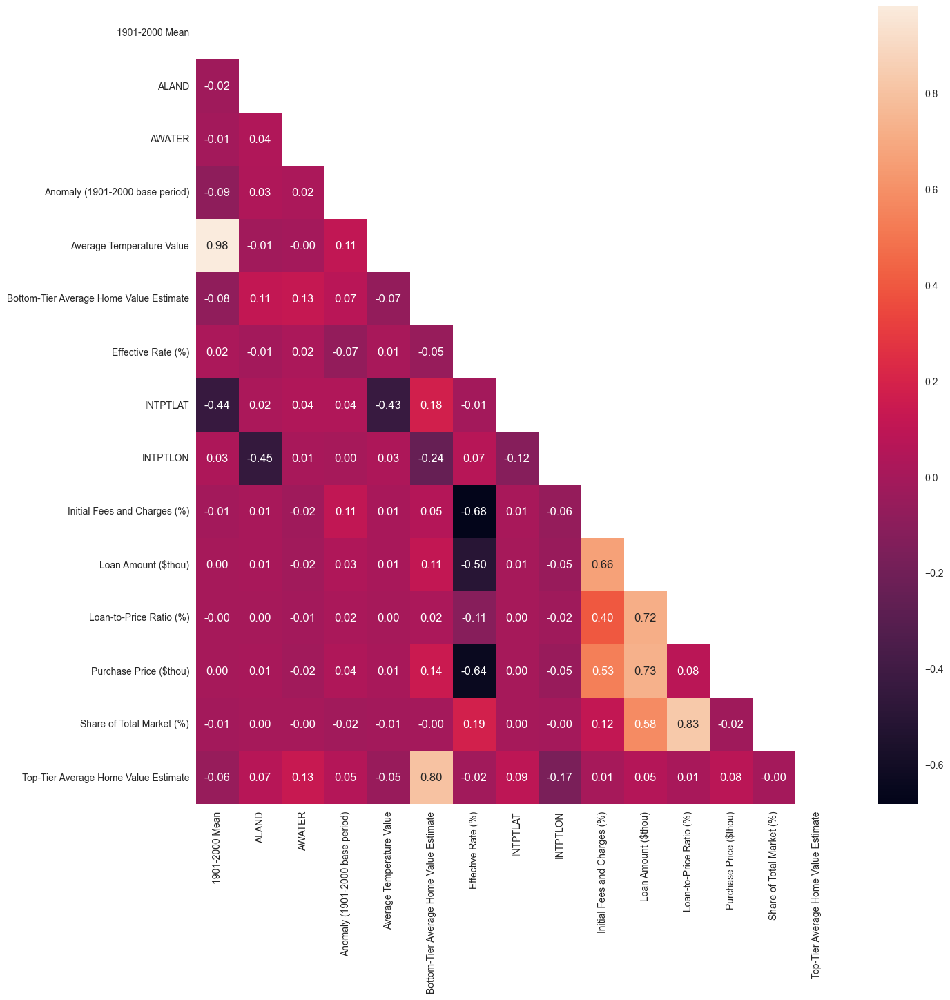

In [106]:
# double check colinearity through a heatmap
plt.figure(figsize=(15,15))

sns.heatmap(
    #get the correlation
    unsupervised.corr(), 
    cmap = color,

    #annotate heat map
    annot=True,
    fmt ='.2f', 

    #mask half of the corr matrix
    mask = np.triu(unsupervised.corr()) 
)

#turn off plt grid and show group
plt.grid(False)
plt.show()

> A brief glance shows that we have colinearity for many features such as initial fees and effective rates, effective rates and purchase prices, average temperature and 1901-2000 mean. We also have a lot of data with 18 features, so we should do PCA on our dataset for better unsupervised results.

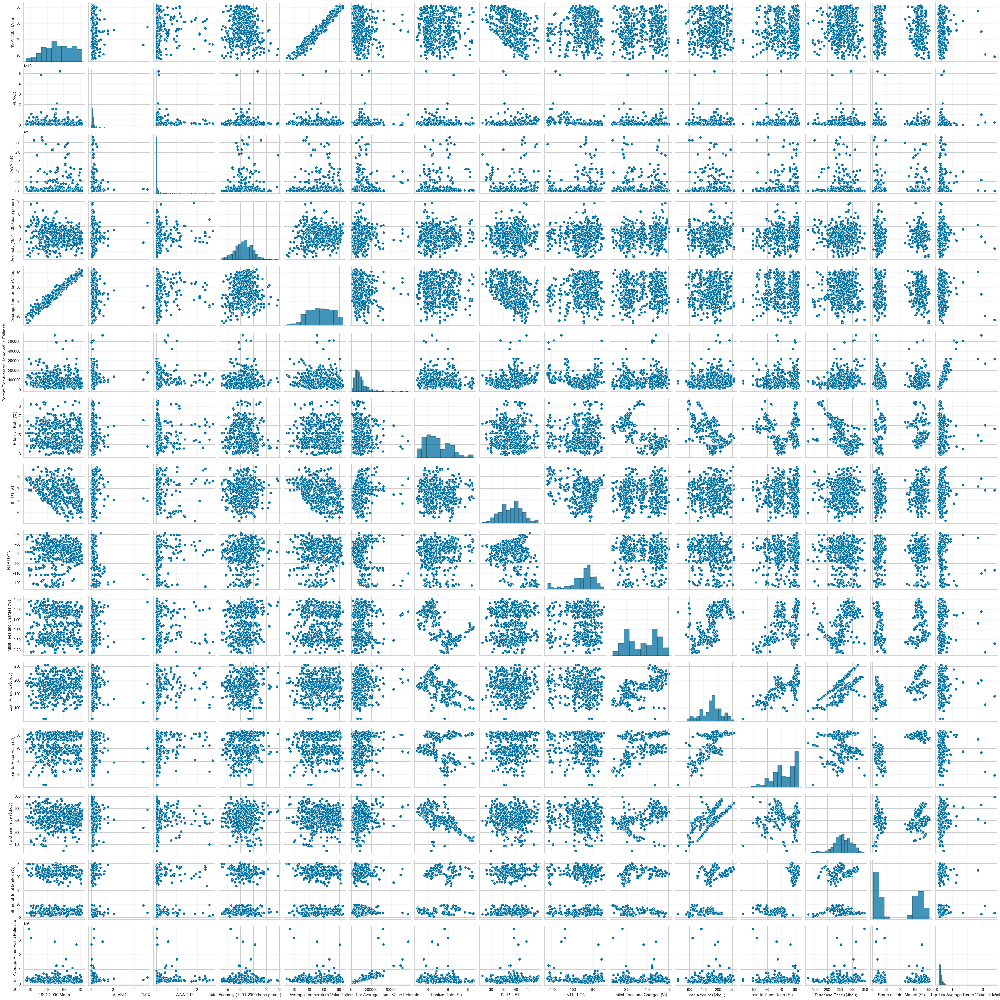

In [110]:
# visualize the clusters through a pairplot of a smaller sample of the dataset (it would take too long to plot the entire dataset)
sns.pairplot(
    unsupervised.sample(500))
plt.xticks(rotation = 45)
plt.show()

> It seems that Month, Year, and Term to Maturity are categorical values that create natural clusters but do not provide new information for our dataset. With a sample of 500 points, we can see some clustering with Share of Total Market.

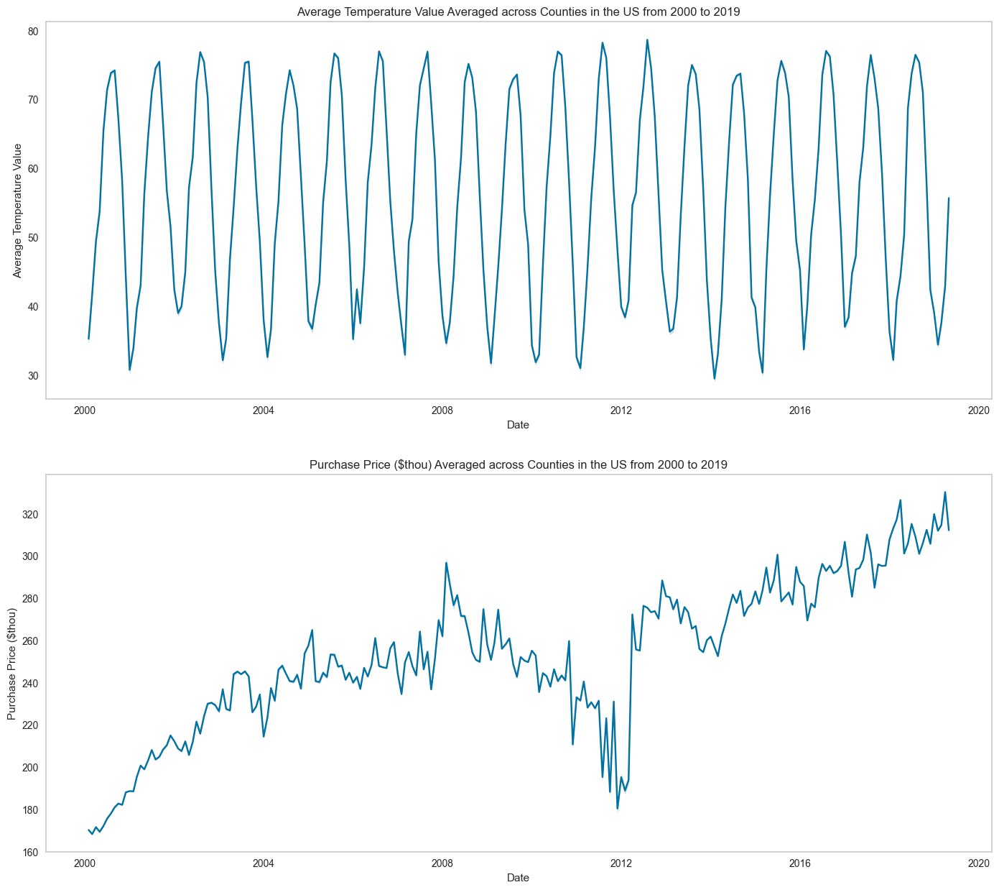

In [69]:
# we have a lot of data and one of our previous visualization shows seasonality so let us check that for housing prices and average temperature

# plotting two sublpots of average housing prices over time and average temperature over time to check for seasonality 
fig, ax = plt.subplots(2,1, figsize=(17,15))
cols = ['Average Temperature Value', 'Purchase Price ($thou)']

for i in range(2):
    sns.lineplot(
        data = data, #let's use the original dataset because it has a 'Date' column
        x = 'Date', 
        y = cols[i], 
        ax= ax[i]
    ).set(
        title = cols[i]+ ' Averaged across Counties in the US from 2000 to 2019'
        #xticklabels = [] #can't really see the exact date since we have too much information so let's just not show it
        )
    ax[i].grid(False)

#show the plots
plt.show()

> There clearly is seasonality for average temperature, but it's not clear for housing prices so let's zoom into two years: 2016 and 2017.

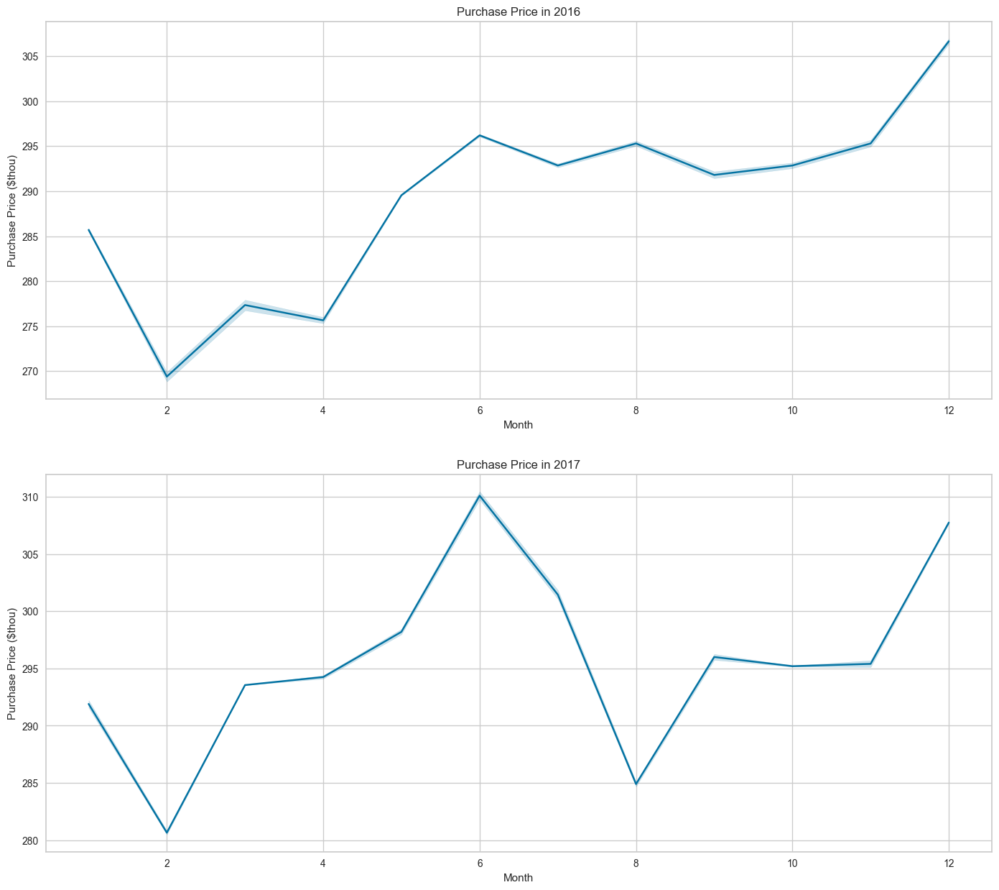

In [62]:
# plotting average housing prices for two years (2016, 2017) to have a better view of seasonality potentials
fig, ax = plt.subplots(2,1, figsize=(17,15))

year = [2016, 2017]

for i in range(2):

    sns.lineplot(
        data = data[data['Year']==year[i]], 
        x = 'Month', 
        y = 'Purchase Price ($thou)', 
        ax=ax[i]
    ).set(title= 'Purchase Price in '+ str(year[i]))

plt.show()

> There might be some seasonality that affects our clusters. This is good to keep in mind when we get the result of our model.

### Exploration Conclusion:
Initial exploration shows that we must (1) drop categorical values, (2) scale our dataset, and (3) perform PCA.

(1) We need to drop categorical values because any clustering methods do not work well with mixed data. (see Ref 2) Since most of our features are numerical dropping the categorical features will help unsupervised algorithms perform better. Plus, we already know the categories so it won't tell us new information about the dataset. However, we should keep in mind that the clustering we uncovered might be heavily influenced by the dropped categorical values. 

(2) Scaling the dataset helps clustering methods, especially those that rely on the distance between data points, as well as PCA. It is recommended for PCA that we scale with StandardScaler because PCA relies on zero-centered inputs (see Ref 3).

(3) We clear have colinearity and instead of making decisions on which features to drop, PCA is a great tool to apply here. It also helps reduce dimensionality with our large dataset of 600,000 rows and 18 features.

## Feature Engineering:
In this part, we will sequentially address the 3 conclusions from our initial observation. The goal is to transform our data into a PC dataframe for further analysis. As a quick summary, these steps are:<br>
(1) Dropping categorical values<br>
(2) Scaling the dataset<br>
(3) Perform CPA

### (1) Dropping Categorical Values

In [11]:
# dropping columns with high correlations with an existing datatype and dropping categorical data
cols = ['Month', 'Year', 'Term to Maturity']
unsupervised = unsupervised.drop(columns=cols)

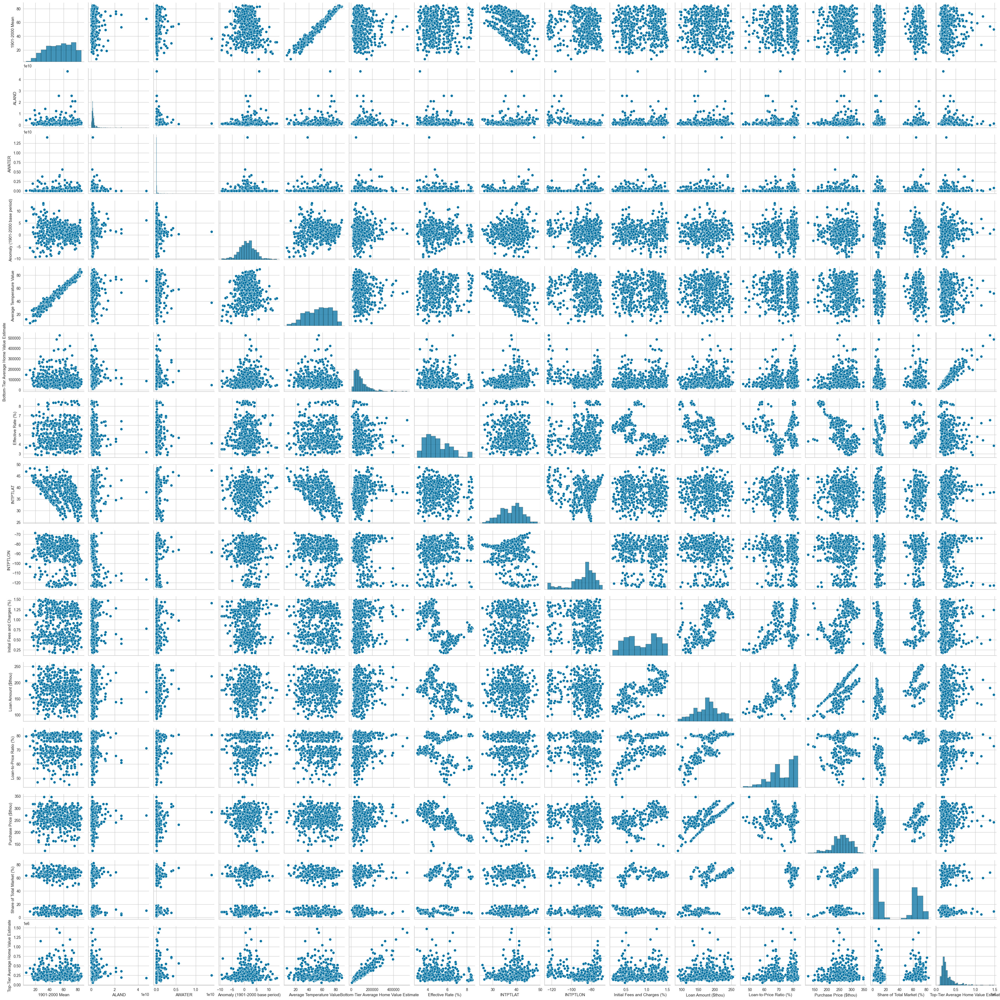

In [71]:
#replotting the pairplot to see the result
sns.pairplot(unsupervised.sample(500))
plt.xticks(rotation = 45)
plt.show()

### (2) Scaling the Dataset

In [12]:
#initalize a scaler
scaler = StandardScaler()

#scale the data
scaled_features = scaler.fit_transform(unsupervised)

# getting a scaled dataframe
X = pd.DataFrame(scaled_features, columns = unsupervised.columns)

#check out the first few rows
X.head()

,1901-2000 Mean,ALAND,AWATER,Anomaly (1901-2000 base period),Average Temperature Value,Bottom-Tier Average Home Value Estimate,Effective Rate (%),INTPTLAT,INTPTLON,Initial Fees and Charges (%),Loan Amount ($thou),Loan-to-Price Ratio (%),Purchase Price ($thou),Share of Total Market (%),Top-Tier Average Home Value Estimate
0,-1.878226,-0.04576,-0.288067,1.539034,-1.569987,-0.256856,2.478430,0.605918,-0.559929,0.105420,-2.007124,-0.913730,-2.350378,-1.040546,-0.391808
1,-1.878226,-0.04576,-0.288067,1.539034,-1.569987,-0.256856,2.632607,0.605918,-0.559929,-0.223290,-1.279980,1.004406,-2.535091,0.813359,-0.391808
2,-1.579980,-0.04576,-0.288067,2.365461,-1.108955,-0.254749,2.616377,0.605918,-0.559929,0.050635,-2.074703,-1.100866,-2.372109,-1.033692,-0.390204
3,-1.579980,-0.04576,-0.288067,2.365461,-1.108955,-0.254749,2.786784,0.605918,-0.559929,-0.305468,-1.336746,1.016102,-2.619298,0.727689,-0.390204
4,-0.954246,-0.04576,-0.288067,1.509519,-0.653759,-0.252694,2.665065,0.605918,-0.559929,-0.058935,-2.055781,-1.147649,-2.260738,-1.033692,-0.388732


### (3) Principal Component Analysis

In [13]:
#initialize PCA
pca = PCA()

#fit the data
pca.fit(X)

PCA()

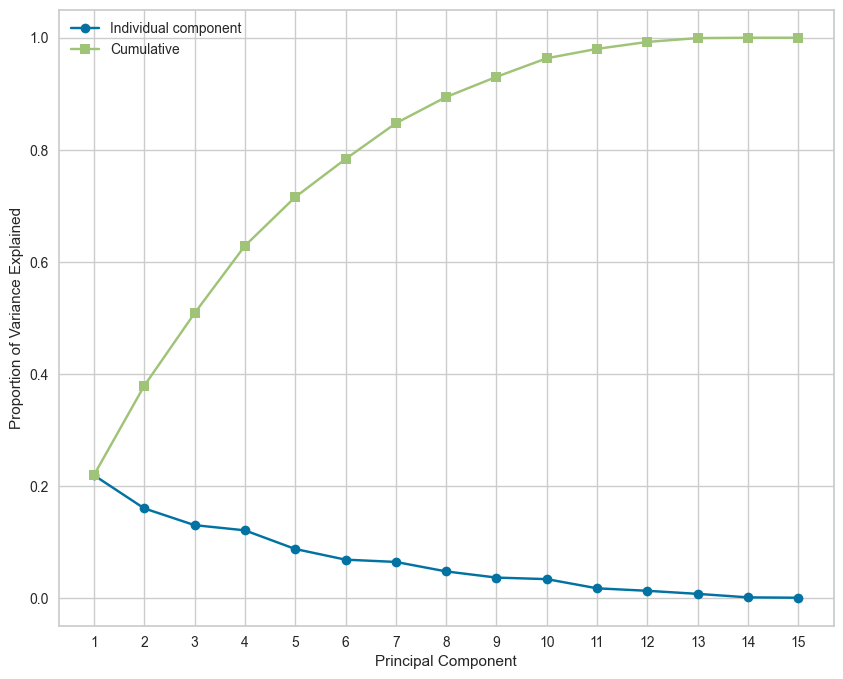

In [15]:
#graphing the cummulative explained variance plot
plt.figure(figsize=(10,8))

#create range of x ticks labels
feats = np.arange(len(pca.explained_variance_ratio_)) + 1

#plotting the lines
plt.plot(feats, pca.explained_variance_ratio_, '-o', label='Individual component')
plt.plot(feats, np.cumsum(pca.explained_variance_ratio_), '-s', label='Cumulative')

#annotating the graph
plt.ylabel('Proportion of Variance Explained')
plt.xlabel('Principal Component')
plt.xticks(feats)
plt.legend(loc=2)

#showing the graph
plt.show();

In [16]:
np.cumsum(pca.explained_variance_ratio_)

array([0.21879903, 0.37834959, 0.50797121, 0.62830925, 0.71534746,
       0.78332812, 0.84722196, 0.89419062, 0.93015478, 0.96335194,
       0.98015713, 0.9925032 , 0.99938687, 0.99999999, 1.        ])

> Let's choose 9 PCs because they explain 93% of our dataset. The increases from PC10 and beyond is only incremental.

In [14]:
chosen_components = 9

pca = PCA(n_components = chosen_components)

#fit and transform X to get the principal components from PCA
X_pca = pd.DataFrame(pca.fit_transform(X), 
                 columns=['PC'+str(i) for i in range(1, chosen_components+1)])
X_pca

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
0,-3.289982,2.388260,-1.198709,-0.055656,0.564186,1.777334,-0.790117,0.412116,-1.293996
1,-1.989475,2.051385,-2.736585,1.713475,0.567079,1.836836,-0.845985,0.418021,-1.234150
2,-3.450215,2.027563,-0.864623,0.075168,0.499991,2.573917,-1.031670,0.270344,-1.159624
3,-2.136587,1.681973,-2.450586,1.902305,0.506540,2.644255,-1.091122,0.273252,-1.163395
4,-3.552593,1.424556,-0.604358,0.265270,0.534005,1.759478,-0.817116,-0.107692,-1.013886
...,...,...,...,...,...,...,...,...,...
579889,2.376940,0.195019,-1.725089,-0.526952,-0.236777,1.357094,-0.450669,0.580186,0.850816
579890,1.074559,0.203717,0.078919,-2.607085,-0.125588,-1.045493,0.271752,0.224959,1.100795
579891,2.557303,-0.196038,-1.774581,-0.456729,-0.121275,-0.947583,0.194310,0.230870,1.126430
579892,1.073780,-0.549874,0.400579,-2.113795,-0.179681,0.505716,-0.166365,-0.067852,0.567405


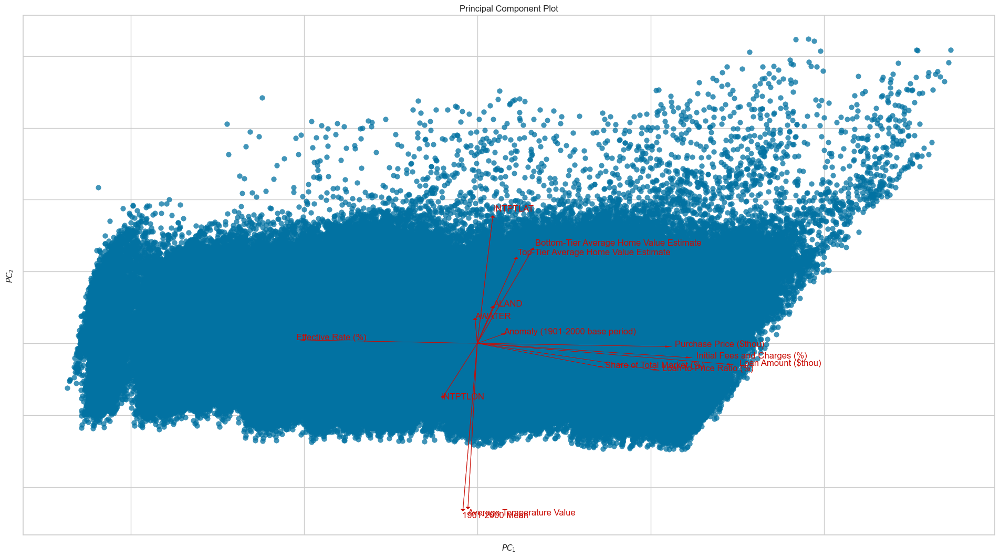

<Axes: title={'center': 'Principal Component Plot'}, xlabel='$PC_1$', ylabel='$PC_2$'>

In [19]:
#plotting PC1 and PC2 and see features' project
visualizer = PCA_viz(
    proj_features=True,
    size = (1920,1080)
    )
visualizer.fit_transform(X)
visualizer.show()

> The Principal Component Plot shows interesting direction of our features. It seems temperature-related features (Average Value and 1991-2000 Mean) explain the dataset as much as housing-related features (purchase price, initial fees, etc.) and latitude. Latitude and Top-/Bottom- Tier Average Values seem to pull our data in relatively the same direction, suggesting colinearity, and are not in the same directions of Housing-related features as well as Temperature-related features.

## Model #1: KMeans Clustering

We will first attempt to do a KMeans clustering model and see if it a good unsupervised model for our data. I will proceed with a random_state = 10 and n_init = 10. 

We will also be using the **Davies-Bouldin Index** for scoring our dataset. I tried using Silhouette Score as my metric but my computer cannot calculate this score with the amount of data I have. When trxying to calculate the Silhouette Score for a default KMeans model with the PCA-transformed dataframe, I had to intervene at 52 minutes of runtime. For Davies-Bouldin, it took 8.3 seconds to run.

The Davies-Bouldin Index calculated the average 'similarity' between clusters. The smaller the index, the better with 0 being the lowest score (see Ref 6).

In [15]:
#select a random seed
seed=10

### KMeans Function
We will first create a function to quickly apply KMeans modeling.

In [16]:
#create a function for faster KMeans modeling:

def KMeansModel(X, k):

    #Initialize the model
    kmeans = KMeans(k, n_init=seed, random_state=seed)

    #Train the Model
    kmeans.fit(X)

    #Evaluate perfomance
    score = davies_bouldin_score(X, kmeans.labels_)

    #return the performance
    return [score, kmeans.labels_]

### Tuning: Finding the Best K
We will now use two metrics: elbowvisualizer and calinski harabasz to determine the best cluster number for our KMeans. I will be plotting for both the dataset with and without PCA because I had some issue with the PCA dataset performing worst than without PCA, so just to make sure we are not missing out on a better model.

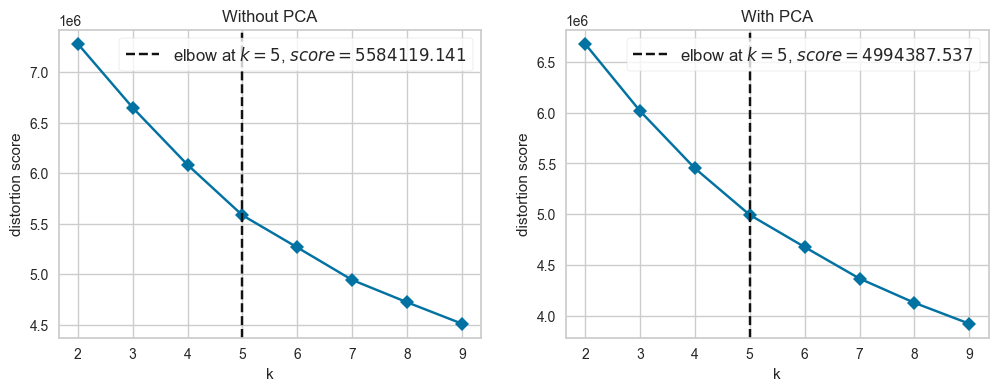

In [ ]:
fig, (ax1, ax2) = plt.subplots(ncols=2,figsize=(12, 4))

#Plotting KMeans without PCA
model = KMeans(random_state=seed, n_init=seed)
visualizer = KElbowVisualizer(model, k=(2,10), timings = False, ax=ax1)
visualizer.fit(X)
visualizer.finalize()

#Plotting KMeans with PCA
model = KMeans(random_state=seed, n_init=seed)
visualizer = KElbowVisualizer(model, k=(2,10), timings = False,  ax=ax2)
visualizer.fit(X_pca)
visualizer.finalize()
ax1.set_title("Without PCA")
ax2.set_title("With PCA");

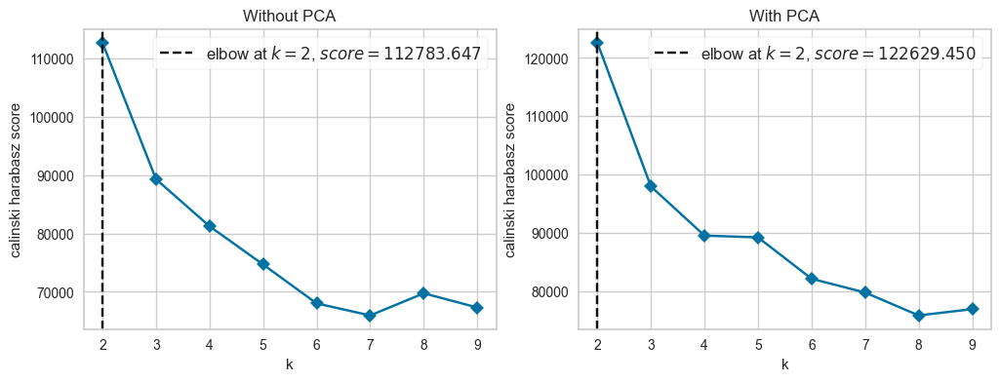

In [ ]:
# Calinski Harabasz

fig, (ax1, ax2) = plt.subplots(ncols=2,figsize=(12, 4))

#Plotting KMeans without PCA
model = KMeans(random_state=seed)
visualizer = KElbowVisualizer(model, k=(2,10), metric='calinski_harabasz', 
                              timings=False, locate_elbow=True, ax=ax1)
visualizer.fit(X)
visualizer.finalize()

#plotting KMeans with PCA
model = KMeans(random_state=seed)
visualizer = KElbowVisualizer(model, k=(2,10), metric='calinski_harabasz', timings=False, locate_elbow=True,  ax=ax2)
visualizer.fit(X_pca)
visualizer.finalize()
ax1.set_title("Without PCA")
ax2.set_title("With PCA");

>From the two graphs, I will try both a k=5 and k=2 and see which k gives me the best index.

In [ ]:
print('No PCA, K = 5, Davies-Bouldin Index: ', KMeansModel(X, 5)[0])
print('No PCA, K = 2, Davies-Bouldin Index: ', KMeansModel(X, 2)[0])
print('PCA, K = 5, Davies-Bouldin Index: ', KMeansModel(X_pca, 5)[0])
print('PCA, K = 2, Davies-Bouldin Index: ', KMeansModel(X_pca, 2)[0])

No PCA, K = 5, Davies-Bouldin Index:  1.7747775910854127
No PCA, K = 2, Davies-Bouldin Index:  2.08145504187499
PCA, K = 5, Davies-Bouldin Index:  1.6855474445079721
PCA, K = 2, Davies-Bouldin Index:  1.9944492123913333


> The best KMneans model is K=5 with PCs because it gives the smallest DB index. Let's save that result and see if we can get a better index from other models. My goal is to find something that gives me an index smaller than 1.

### Visualizing Results for the Best KMeans
We will extract the labels and visualize the clusters between Housing Prices and Average Temperature.

In [17]:
# defining a function for quicker visualization
def visualizing_cluster(X_results, labels, method):
    
    #initalizing subplots
    fig, ax = plt.subplots(1,2, figsize=(15,7))
    fig.suptitle('Box Plots for Purchase Price and Average Temperature by Cluster, '+ method)

    #selecting price and average temperature
    cols = ['Purchase Price ($thou)','Average Temperature Value']

    #plotting
    for i in range(2):
        sns.boxplot(ax = ax[i], data= X_results, y = cols[i], x = labels).set(xlabel = 'Cluster')

    #showing the plot
    plt.tight_layout(pad=2)
    plt.show()

    #initializing a figure
    fig = plt.figure(figsize = (15,7))

    #plotting the scatterplot
    if method != 'DBSCAN()':
        legend = 'full'
    else:
        legend = False
        
    sns.scatterplot(
        data = X_results, 
        x = 'Purchase Price ($thou)', 
        y = 'Average Temperature Value', 
        hue = labels,
        palette='tab10',
        legend=legend)
    plt.title('Purchase Price and Average Temperature Clusters, ' + method)
    #showing the plot
    plt.show()

In [18]:
# getting the best kmeans
score_kmeans, labels_kmeans = KMeansModel(X_pca, 5)

In [19]:
# creating a results dataframe with labels
X_results = data.copy()

# add a column for KMeans Labels
X_results["labels_kmeans"] = labels_kmeans
X_results.head()

,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,FUNCSTAT,...,StateAbbrv,Initial Fees and Charges (%),Effective Rate (%),Term to Maturity,Loan Amount ($thou),Purchase Price ($thou),Loan-to-Price Ratio (%),Share of Total Market (%),StateFPS,labels_kmeans
0,31,109,00835876,31109,Lancaster,Lancaster County,06,H1,G4020,A,...,NE,0.93,8.01,15,103.0,173.6,64.7,7.0,31,0
1,31,109,00835876,31109,Lancaster,Lancaster County,06,H1,G4020,A,...,NE,0.81,8.20,30,129.9,166.8,81.1,61.1,31,3
2,31,109,00835876,31109,Lancaster,Lancaster County,06,H1,G4020,A,...,NE,0.91,8.18,15,100.5,172.8,63.1,7.2,31,0
3,31,109,00835876,31109,Lancaster,Lancaster County,06,H1,G4020,A,...,NE,0.78,8.39,30,127.8,163.7,81.2,58.6,31,3
4,31,109,00835876,31109,Lancaster,Lancaster County,06,H1,G4020,A,...,NE,0.87,8.24,15,101.2,176.9,62.7,7.2,31,0


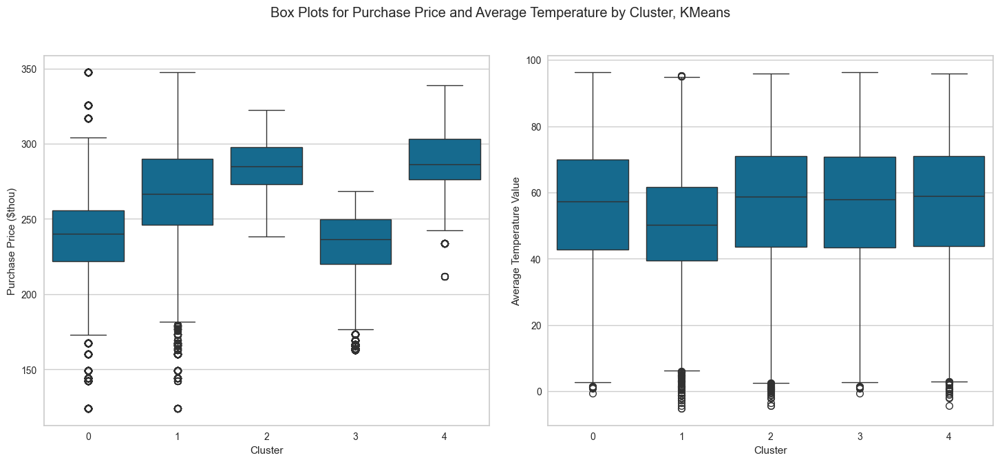

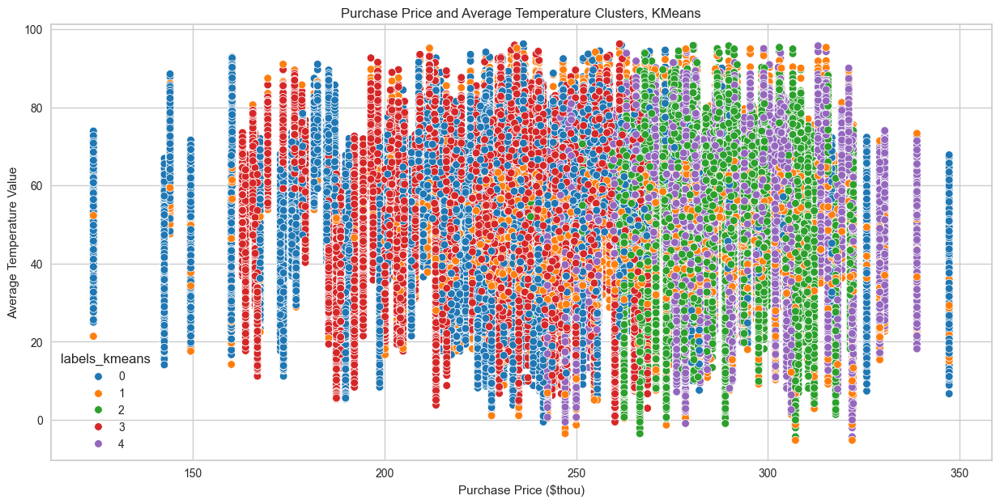

In [33]:
#calling our function to visualize the results
visualizing_cluster(X_results, 'labels_kmeans', 'KMeans')

### Conclusion:
The best KMeans model gives us five clusters. The box plot shows that the clusters are relatively different from one another for purchase price but are quite evenly spread out across average temperature values. The scatterplot reaffirms the boxplots by showing that all clusters are spread out on the vertical axis, but for the horizontal axis, we can see clearer trends: cluster #3 is further to the left (lower prices) while #2 and #4 is located further to the right (higher prices).

## Model #2: Hierarchical Clustering

Next, we will try Hierarchical clustering.

### Finding the best number of clusters
We first should use a dendogram to see which type of linkage and number of clusters might make sense for our dataset.

In [ ]:
# we do not recommend running this cell because it requires 1.22 TiB of memory
# depending on the configuration of your laptop/computer, it might result in a MemoryError
# we are only leaving this cell to demonstrate that we tried this model with the entire dataset

# plotting four dendograms, each with different linkage style
style = ['single', 'average', 'complete', 'ward'] 

for i in style:

    # initalizing the dendogram with a linkage style in the list above 
    Z = linkage(X_pca, i)

    # customizing the dendogram
    plt.figure(figsize=(20,10))
    plt.grid(False)
    plt.title(i+' linkage')
    plt.xlabel("index")
    plt.ylabel("distance")

    # plotting a truncated dendogram for less computational time
    dendrogram(Z, leaf_font_size=10, truncate_mode='level',p=5);

MemoryError: Unable to allocate 1.22 TiB for an array with shape (168138235671,) and data type float64

> Because we have around 600,000 samples, hierarchical clustering will not run due to a MemoryError. Let's try hierarchical clustering with 10,000 random samples instead. We will be able to observe some clustering trends among our dataset but will not be able to get the labels for our entire dataset with hierarchical clustering.

In [23]:
# getting 10,000 samples
X_sample = X_pca.sample(10000, random_state=seed)

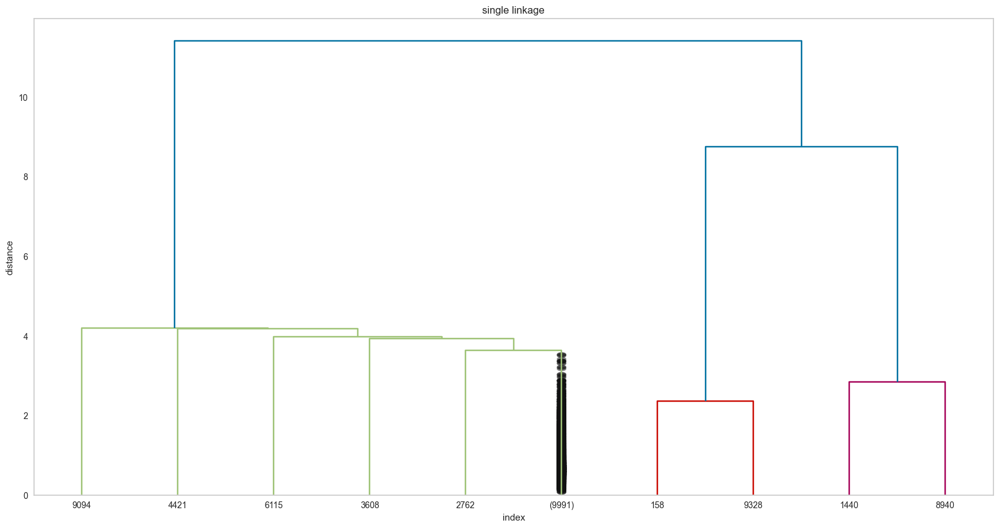

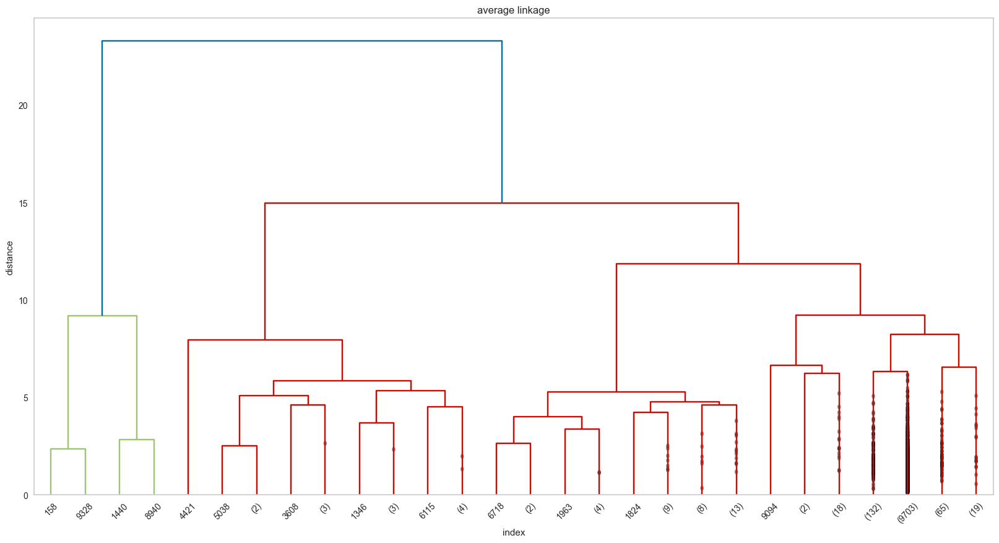

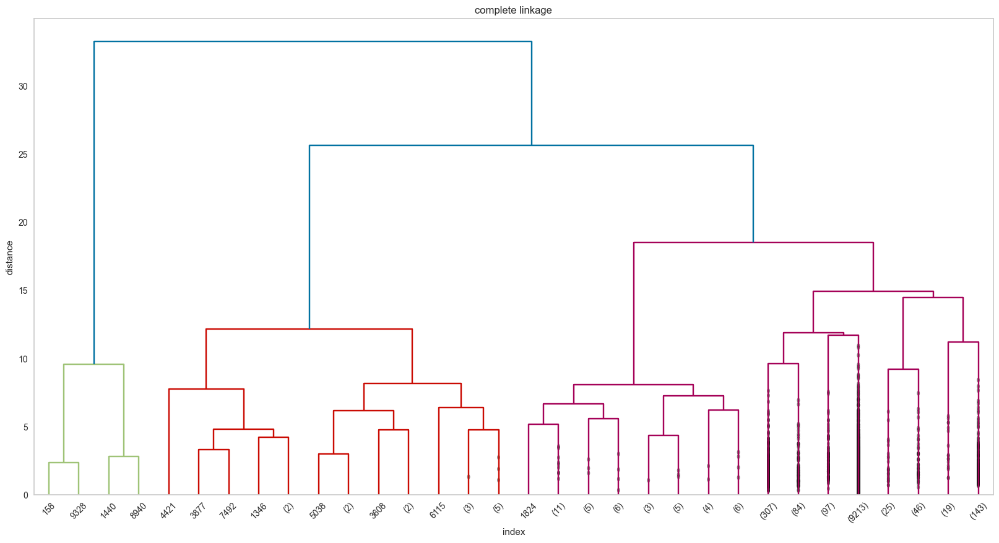

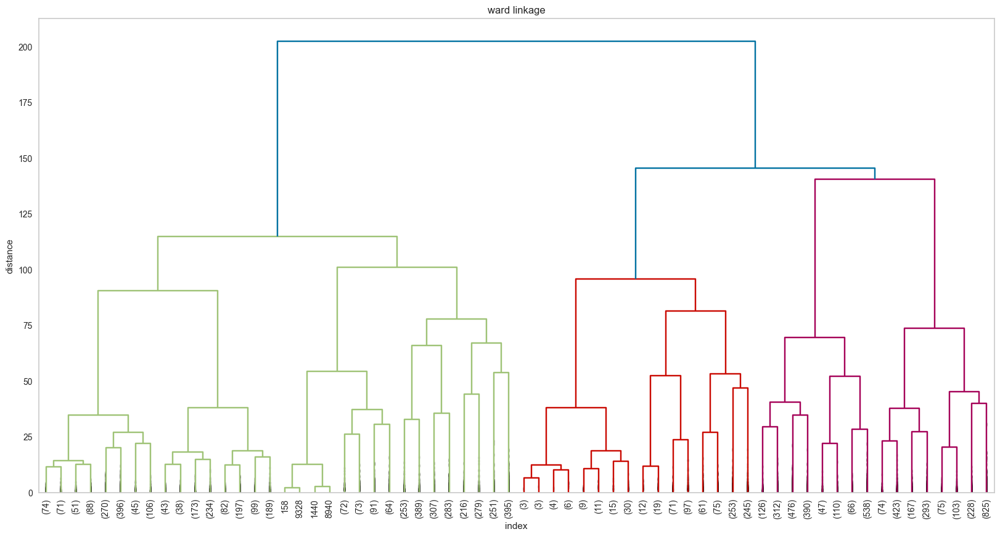

In [ ]:
# replotting the dendogram with 10,000 samples.

#create a list of linkage types
style = ['single', 'average', 'complete', 'ward']


for i in style:

    #initialize linkage with 10,000 samples and same seed
    Z = linkage(X_sample, i)

    #annotating the dendogram
    plt.figure(figsize=(20,10))
    plt.grid(False)
    plt.title(i+' linkage')
    plt.xlabel("index")
    plt.ylabel("distance")

    #graphing the dendogram (using truncate_mode to only include the top nodes)
    dn = dendrogram(Z, truncate_mode='level', p = 5, leaf_font_size=10, show_contracted=True)
    plt.show()

> Looking at the count of samples at the end, I think ward has the best balance between the leaf. Let's focus on getting a cut-off that makes sense for the ward dendogram.

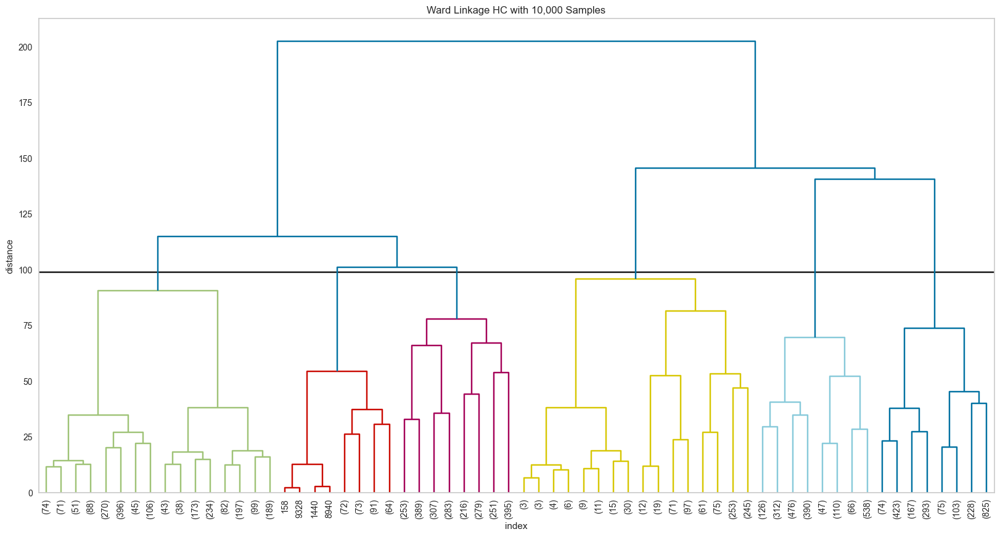

In [ ]:
#initialize linkage with 10,000 samples and same seed
Z = linkage(X_sample, 'ward')

#annotate the plot
plt.figure(figsize=(20,10))
plt.grid(False)
plt.title('Ward Linkage HC with 10,000 Samples')
plt.xlabel("index")
plt.ylabel("distance")

#choosing a cut-off
d = 99

#adding the cut-off line
plt.axhline(y=d, c='k')

#graphing the dendogram (using truncate_mode to only include the top nodes)
dendrogram(Z, leaf_font_size=10, color_threshold=d, truncate_mode= 'level', p = 5)
plt.show()

### Conclusions
After trying out different d values, I find that between 95 and 100, I can cut up section A while keeping section B as one cluster (see attached image for better illustration). I want to cut section A into 2 clusters because there are leaves with huge index number (look at the leaves on the far left that have 9328, 1140, etc.). However, when d is lower than 95, it cuts section B into 2 smaller clusters which have very low index leaves of 3-4. To best balance these leaves, I need to cut up section A while maintaining section B. I found 99 to serve my purpose. That suggest **6 clusters** with **ward** linkage.   

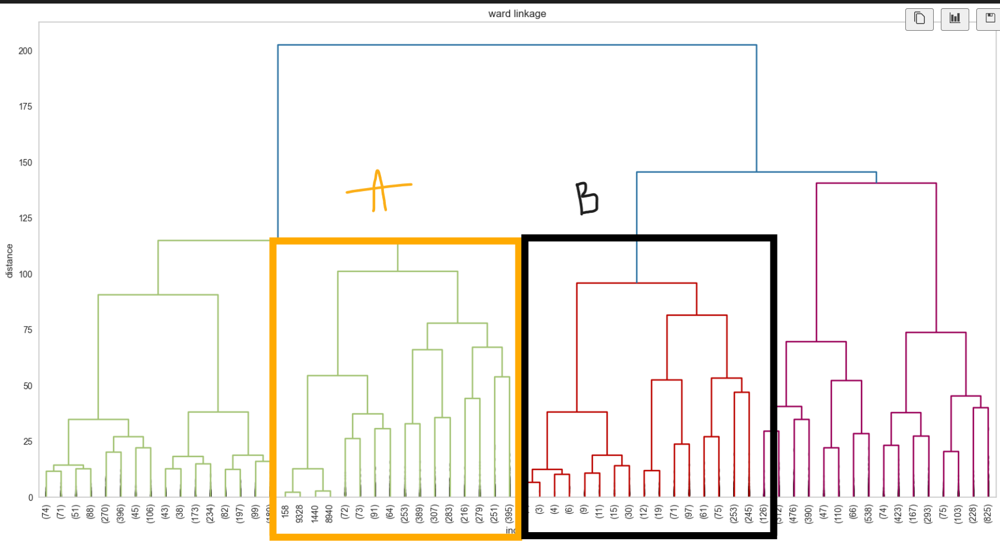

### Modeling
We now use AgglomerativeClustering() to see how our model perform.

In [24]:
# initializing an Agglomerative Clustering model with 6 clusters and ward linkage style
hc = AgglomerativeClustering(n_clusters=6,linkage='ward')

#getting X's sample's lables 
labels_hc = hc.fit_predict(X_sample)

#getting the Davies Bouldin Score
hc_score = davies_bouldin_score(X_sample, labels_hc)

#print out the performance
print('Performance: ', hc_score)

Performance:  1.690917292023383


> Not as good as KMeans and I also was not able to get labels for the full dataset, but let's visualize the results to see if there are interesting characteristics for the clusters using HC.

### Visualizing the Results

In [25]:
# creating a results dataframe with labels
X_sample_results = data.sample(10000, random_state = seed).copy()

# add a column for HC Labels
X_sample_results["labels_hc"] = labels_hc
X_sample_results.head()

,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,FUNCSTAT,...,StateAbbrv,Initial Fees and Charges (%),Effective Rate (%),Term to Maturity,Loan Amount ($thou),Purchase Price ($thou),Loan-to-Price Ratio (%),Share of Total Market (%),StateFPS,labels_hc
473260,39,097,01074061,39097,Madison,Madison County,06,H1,G4020,A,...,OH,1.08,3.99,15,211.5,338.9,65.0,6.9,39,3
91859,51,045,01673664,51045,Craig,Craig County,06,H1,G4020,A,...,VA,1.31,4.70,30,209.3,265.6,81.4,62.7,51,4
55272,16,053,00395662,16053,Jerome,Jerome County,06,H1,G4020,A,...,ID,0.49,4.85,15,157.2,254.4,68.3,10.2,16,0
572927,33,001,00873174,33001,Belknap,Belknap County,06,H1,G4020,A,...,NH,0.64,6.26,30,190.4,251.9,78.0,80.7,33,5
113911,08,037,00198134,08037,Eagle,Eagle County,06,H1,G4020,A,...,CO,0.70,8.05,30,137.2,179.3,79.9,72.6,08,0


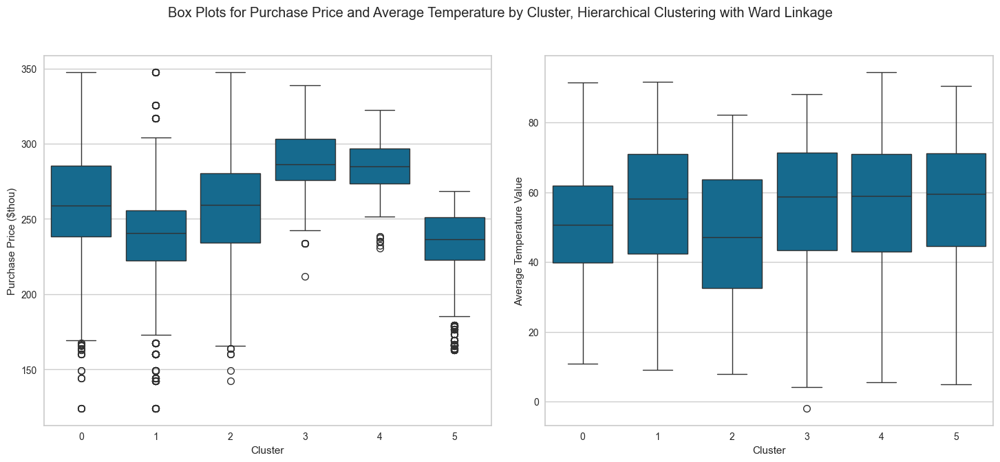

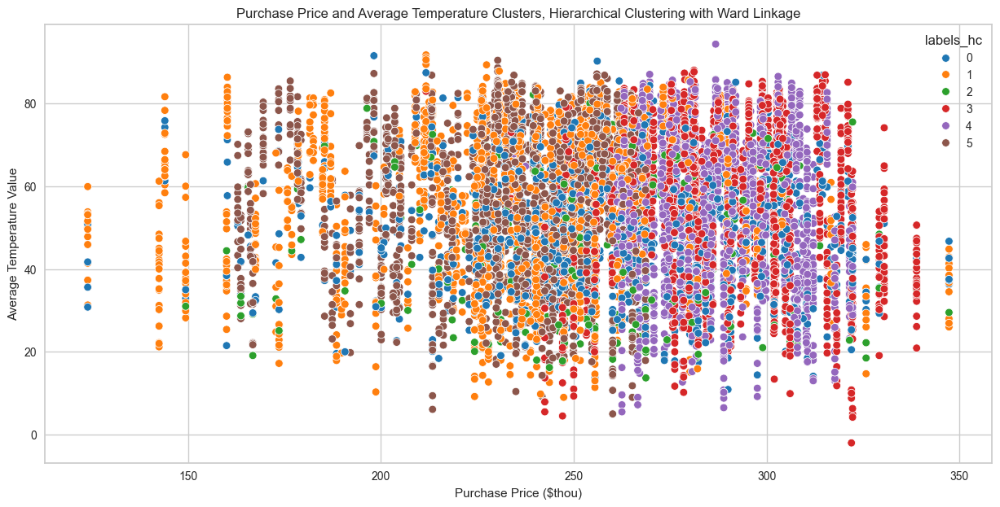

In [28]:
#calling our function to visualize the results
visualizing_cluster(X_sample_results, 'labels_hc', 'Hierarchical Clustering with Ward Linkage')

> We can't fully interpret this result for the entire dataset, but at least for these samples, we 

## Model #3: DBSCAN
This is an additional clustering model I will try. DBSCAN clusters by density and is scalable to big dataset. It views clusters as areas of high density separated by areas of low density and able to form clusters in any shape (as opposed to KMeans that assume our clusters are convex) (see Ref 13). It is quite popular among clusters with high density like our dataset.

### Default Model:
We will start with a default DBSCAN model. These parameters are: (eps=0.5, *, min_samples=5, metric='euclidean', metric_params=None, algorithm='auto', leaf_size=30, p=None, n_jobs=None) (see Ref 12). 

In [ ]:
# initalize a DBSCAN() model
dbs = DBSCAN()

# fit the data
dbs.fit(X_pca)

#get an intial score
score_dbs = davies_bouldin_score(X_pca, dbs.labels_)

# print the model's performance
print('Performance: ', score_dbs)

Performance:  1.2749899182549822


> This is the best result we have seen so far! Let's try tuning DBSCAN and see if we can get to lower than 1.

### Tuning:
According to Ref. 14, two parameters are the most important to tune for DBSCAN: min_samples and eps (epsilon). 
- min_samples: Ref. 14 recommends choosing a min sample that at least twice the number of dimensions in our dataset, especially when our dataset has a lot of noise. The PC dataset has 9 components so let's definitely include 2*9 = 18 in our values for tuning. We will also try a few min_samples larger than 18 to see if it makes a difference for our model.
- epsilon: after we have an optimized min_samples, ref. 14 recommends using a K-distance elbow plot to determine the best epsilon. In other words, we will sort the points by its distance to the nearest k neighbor, with k = 2 * dim, and eye-ball the elbow where this line increases dramatically. Instead of eyeballing a point, I will eyeball a range of epsilons for each min_samples and select the min_samples, epsilon combination that gives me the best result.

I will not use GridSearchCV for this, mostly due to run-time. I tried using GridSearchCV to evaluate between min_samples = 9 and min_samples = 18 without even doing cross-validation, and it couldn't give me a result after 56 minutes(see below). The default dbscan() only took 3 minutes per min_samples value, so I think it's going to be fast to hard-code our gridsearch for these two parameters with for loops.

>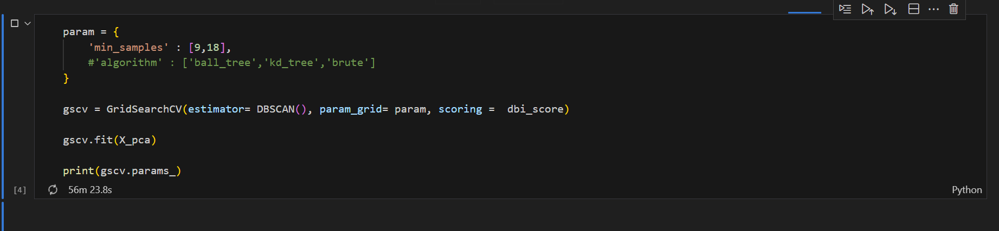

In [ ]:
#THIS CELL SHOULD BE DELETED LATER--
#i exported X_pca into a csv so I can skip all of the cleaning parts and quickly get to DBSCAN
X_pca = pd.read_csv('X_pca.csv')
X_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
0,-3.102761,1.508369,1.612449,2.184904,1.975812,1.786389,2.346093,1.105544,-1.452726
1,-1.802254,1.171494,0.074572,3.954035,1.978705,1.845892,2.290224,1.111448,-1.392880
2,-3.379935,2.796132,-1.092142,0.325933,-0.421220,1.352064,2.499917,0.310244,-1.207435
3,-2.079428,2.459257,-2.630018,2.095064,-0.418327,1.411567,2.444048,0.316149,-1.147589
4,-3.480487,-0.424068,0.101561,0.700817,0.862015,1.490991,-0.341938,1.598697,-1.318203


In [ ]:
#initalize the Nearest Neighbors algorithm that finds a point nearest neighbor
neighbors = NearestNeighbors(n_neighbors = 18)

#fit to the data
neighbors.fit(X_pca)

#get the points' distances to their nearest neighbors
distances, indices = neighbors.kneighbors(X_pca)

#order points by their distance to the nearest neighbor
distances = np.sort(distances, axis=0)
distance = distances[:,1]

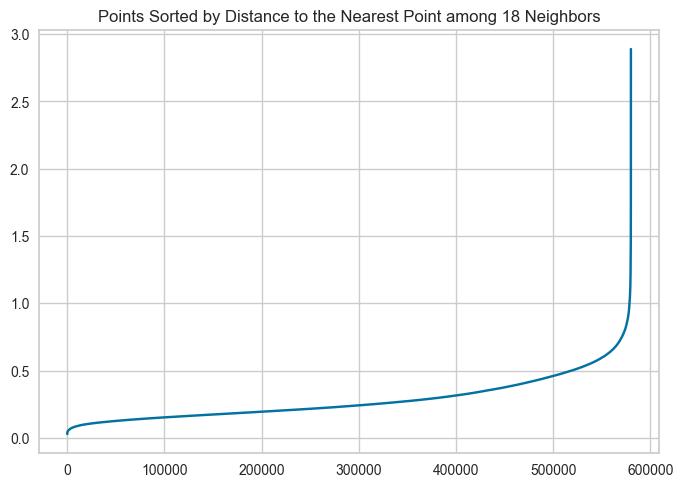

In [ ]:
# plot a line graph of the points sorted by its distance to 
plt.plot(distance)
plt.title('Points Sorted by Distance to the Nearest Point among 18 Neighbors')
plt.show()

In [ ]:
#define a function to find epsilon based on a min_samples input

def find_epsilon(minPts):

    epsilon =[]

    #trying different epsilon from 0.45 to 1 in steps of 0.05
    for i in [0.45+i*0.05 for i in range(12)]:

        #initialize the model with chosen min_samples and eps 
        dbs = DBSCAN(min_samples=minPts, eps=i)
        
        #fit to data
        dbs.fit(X_pca)

        #get the davies bouldin score
        score = davies_bouldin_score(X_pca, dbs.labels_)

        #append to list of results
        epsilon.append([i, score])

    return pd.DataFrame(epsilon, columns=['epsilon', 'DB Index'])

In [ ]:
#takes 92 minutes to run
eps_18 = find_epsilon(18)
eps_18

,epsilon,DB Index
0,0.45,1.473271
1,0.50,1.475011
2,0.55,1.348007
3,0.60,1.442000
4,0.65,1.376603
5,0.70,1.417793
6,0.75,1.397424
7,0.80,1.318577
8,0.85,1.335645
9,0.90,1.390239


In [ ]:
#takes 66 minutes to run
eps_19 = find_epsilon(19)
eps_19

,epsilon,DB Index
0,0.45,1.475985
1,0.50,1.500787
2,0.55,1.358402
3,0.60,1.412694
4,0.65,1.370813
5,0.70,1.451285
6,0.75,1.408073
7,0.80,1.344550
8,0.85,1.291687
9,0.90,1.425404


In [ ]:
#takes 65 minutes to run
eps_20 = find_epsilon(20)
eps_20

,epsilon,DB Index
0,0.45,1.486222
1,0.50,1.473333
2,0.55,1.356084
3,0.60,1.424062
4,0.65,1.401325
5,0.70,1.439877
6,0.75,1.418717
7,0.80,1.365897
8,0.85,1.275952
9,0.90,1.428955


In [ ]:
#takes 64 minutes to run
eps_21 = find_epsilon(21)
eps_21

,epsilon,DB Index
0,0.45,1.503944
1,0.50,1.454713
2,0.55,1.402328
3,0.60,1.413953
4,0.65,1.425687
5,0.70,1.416320
6,0.75,1.426620
7,0.80,1.394603
8,0.85,1.314492
9,0.90,1.389012


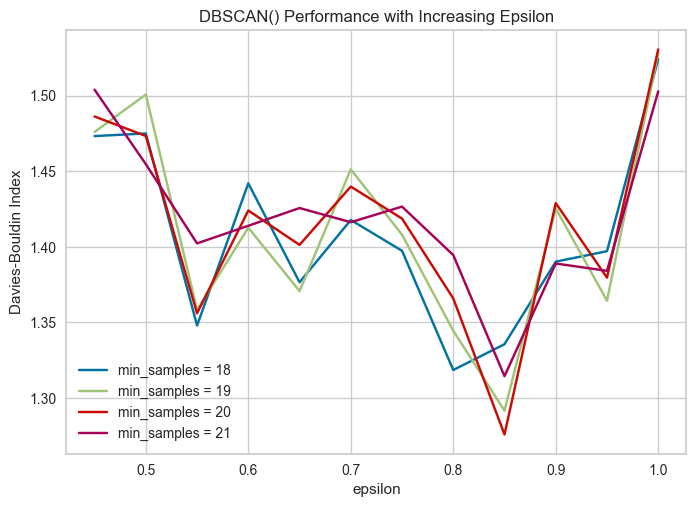

In [ ]:
#plotting DBIndex of diffrent min_samples over increasing epsilon
plt.plot(eps_18['epsilon'], eps_18['DB Index'], label = 'min_samples = 18')
plt.plot(eps_19['epsilon'], eps_19['DB Index'], label = 'min_samples = 19')
plt.plot(eps_20['epsilon'], eps_20['DB Index'], label = 'min_samples = 20')
plt.plot(eps_21['epsilon'], eps_21['DB Index'], label = 'min_samples = 21')

#customize the plot
plt.xlabel('epsilon')
plt.ylabel('Davies-Bouldin Index')
plt.title('DBSCAN() Performance with Increasing Epsilon')
plt.legend()
plt.show()

> The best combination is min_samples = 20 and eps = 0.85 (gives the lowest Davies-Bouldin Index).

In [26]:
#takes 13 minutes to run

#getting the best DBSCAN()
dbs = DBSCAN(min_samples = 20, eps = 0.85)

#fit the data
dbs.fit(X_pca)

#get the labels
labels_db = dbs.labels_

#get db scores
score_dbs = davies_bouldin_score(X_pca, labels_db)

In [27]:
#get the labels
X_results['labels_db'] = labels_db

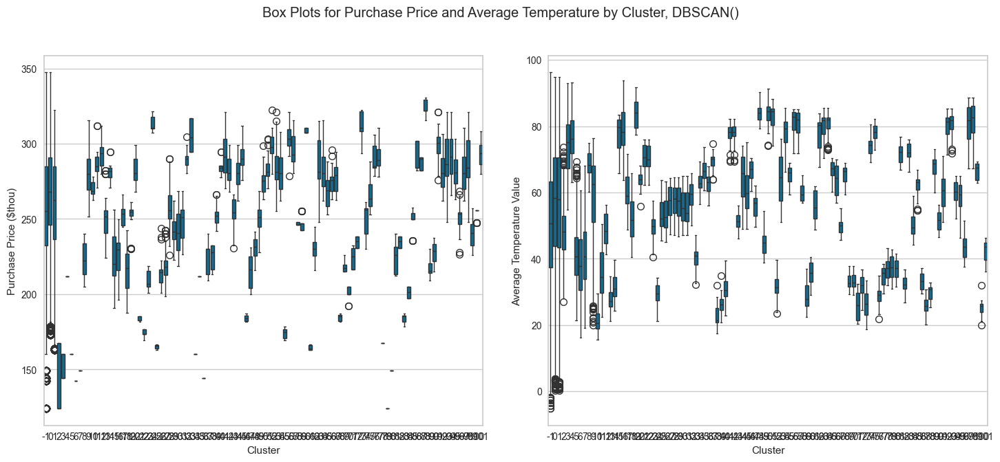

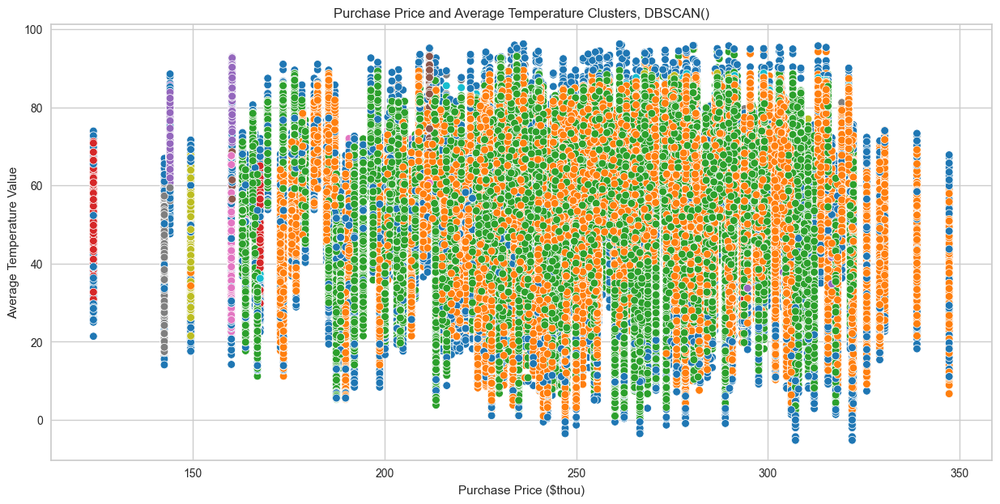

In [28]:
#visualize the results
visualizing_cluster(X_results, 'labels_db', 'DBSCAN()')

In [29]:
# There seem to be a lot of clusters. Let's get a count of how many
n_clusters_ = len(set(labels_db))
print('Number of clusters: ', n_clusters_)

Number of clusters:  103


> DBSCAN() gives us more than 100 clusters, but looking at the scatter plot between purchase price and average temperature, there seems to be three dominant clusters towards the right of purchase price. In other words, the model finds more irregularities in lower-price housing with a min_samples of 20 and eps of 0.85. Let's use a bar chart to see how many clusters are dominant and what does this imbalance looks like.

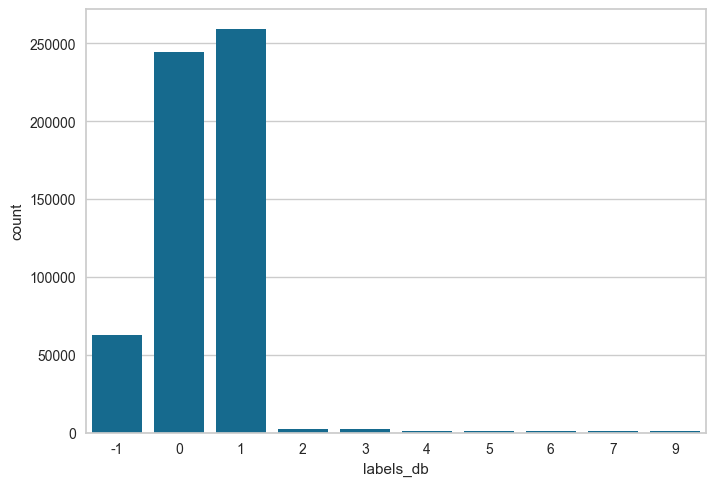

In [32]:
#see the count of samples in each clusters
sns.barplot(X_results['labels_db'].value_counts().sort_values(ascending=False).head(10))
plt.show()

> There seems to be three dominant clusters. Let's first examine these dominant clusters in more details.

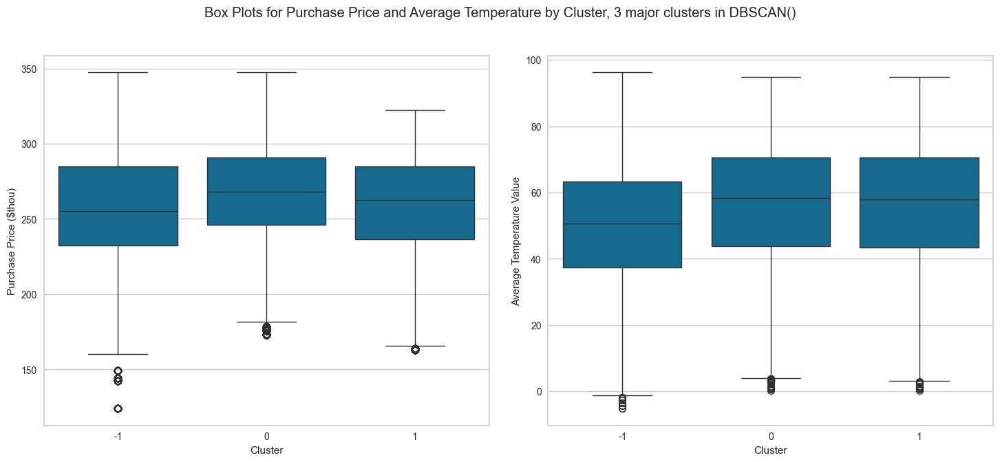

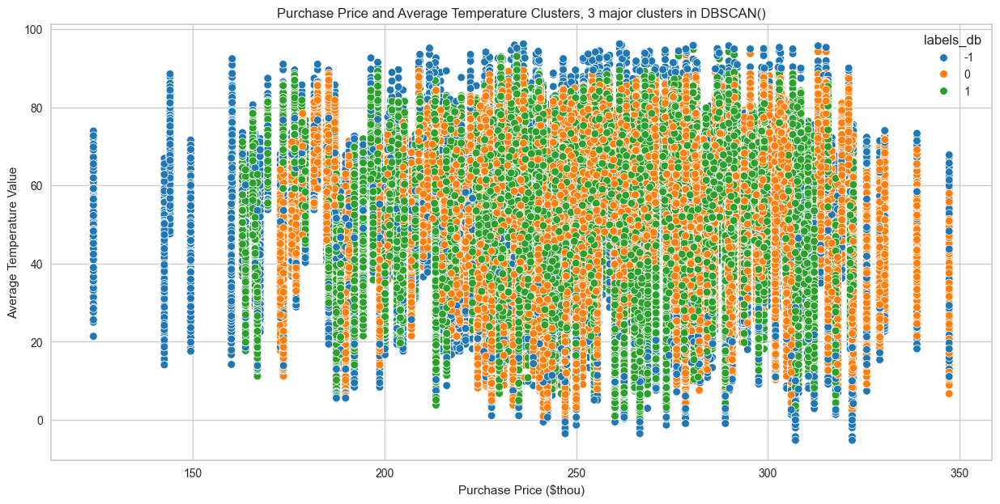

In [37]:
# only focusing on three majority clusters, what do they look like?
visualizing_cluster(X_results[X_results['labels_db'].isin([-1,1,0])], 'labels_db', '3 major clusters in DBSCAN()')

>It looks as if without the minority clusters, the first three clusters already cover much of the spread of Average Temperature and Purchase Price. Let's group all the minority cluster into one category (we are not calling it a cluster but just a category) for easy mapping.

In [39]:
# denoting all non-dominant clusters as category 2
X_results['labels_db'] = X_results['labels_db'].apply(lambda x: 2 if x not in [-1,1,0] else x)

## Mapping the Clusters on a US County Map
Because we have the geodata for the clusters, let's map them up into a US county map and see the difference between 4 years: [2000, 2008, 2012, 2019]. I chose 2008 and 2012 specifically because, looking at the purchase price over time plot in Initial Exploration, we can see that purchase price began dropping since 2008 then skyrocketted in 2012. This makes these two years anomalies to the rest of our time.

In [46]:
# define a mapping function
def mapping(data, labels, method):

    for i in [2000, 2008, 2012, 2019]:
        df = data[data['Year']==i]
        fig, ax = plt.subplots(1, 1, figsize=(12, 6))
        ax.set_xlim(-130, -65)
        ax.set_ylim(24, 50)
        ax.set_axis_off()
        ax.set_title(method + ' Clusters by US Countiers in ' + str(i))
        us_counties.geometry.boundary.plot(ax=ax, edgecolor='k',linewidth = 0.5)
        df.plot(column=labels, ax=ax, cmap='rocket', legend = True)


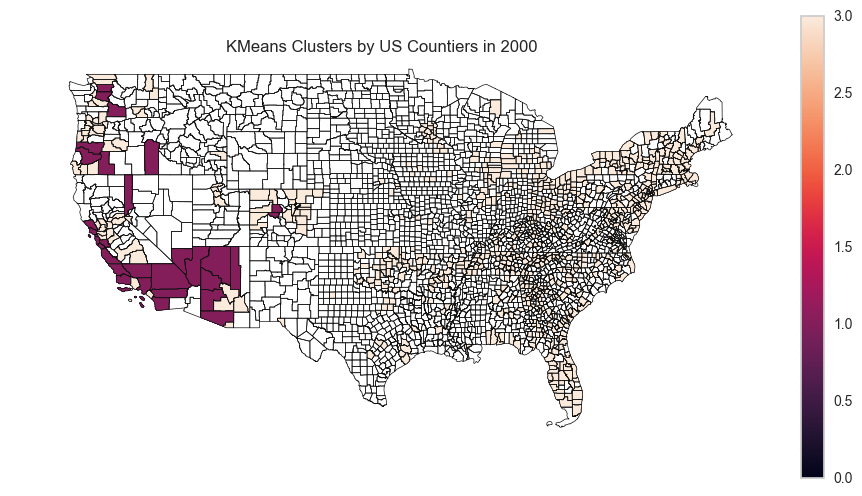

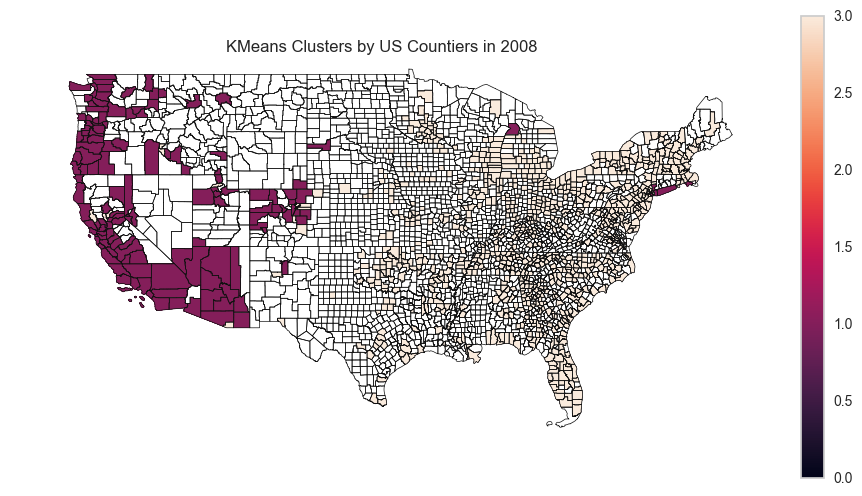

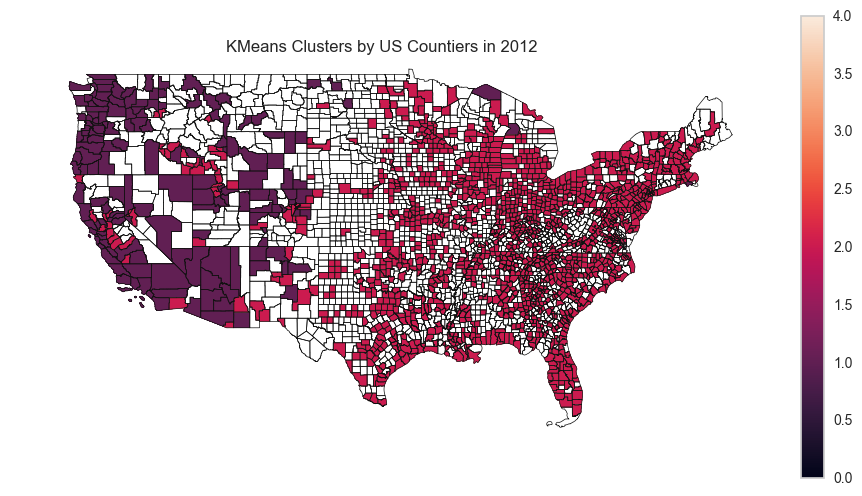

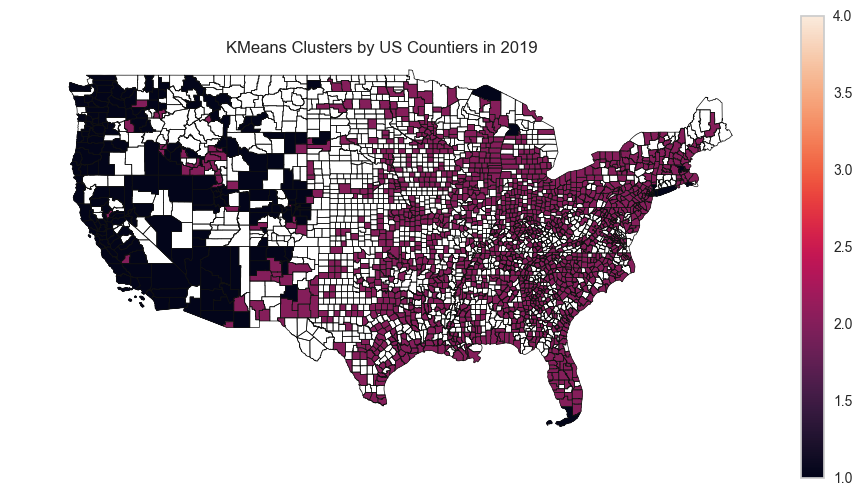

In [47]:
mapping(X_results, 'labels_kmeans', 'KMeans')

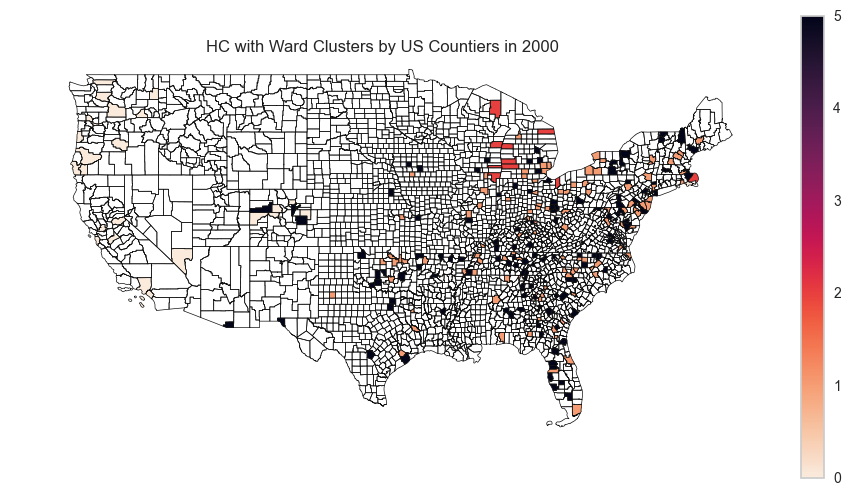

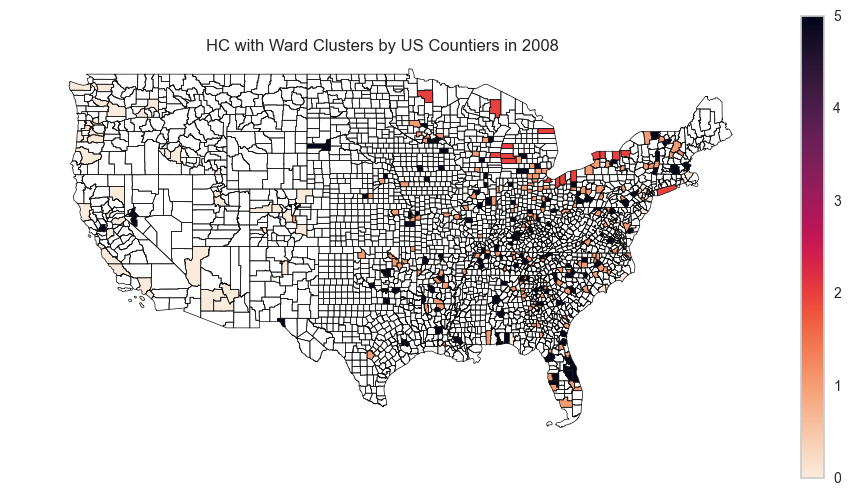

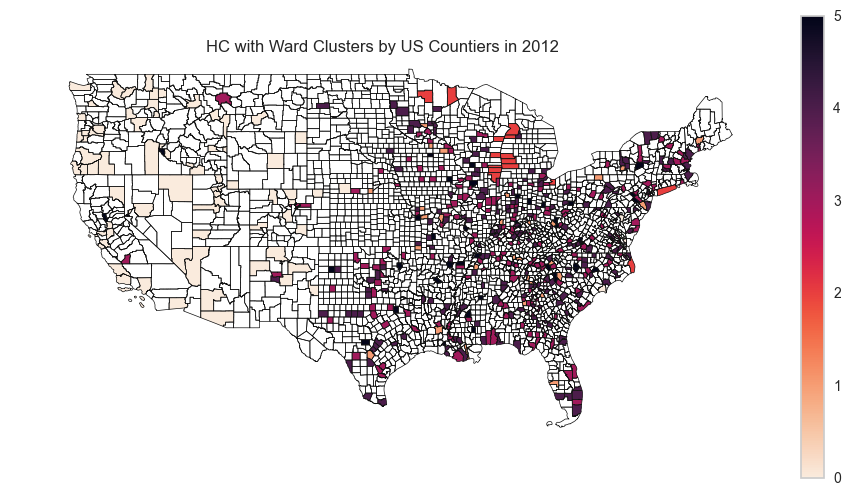

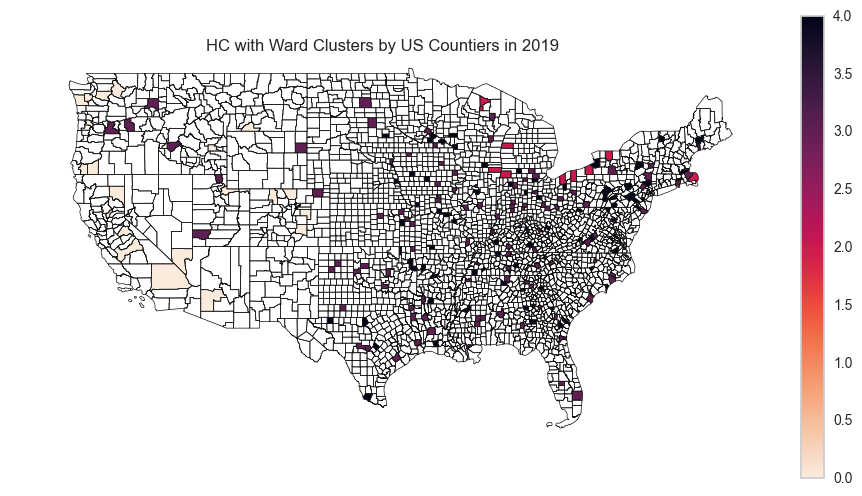

In [ ]:
mapping(X_sample_results, 'labels_hc','HC with Ward')

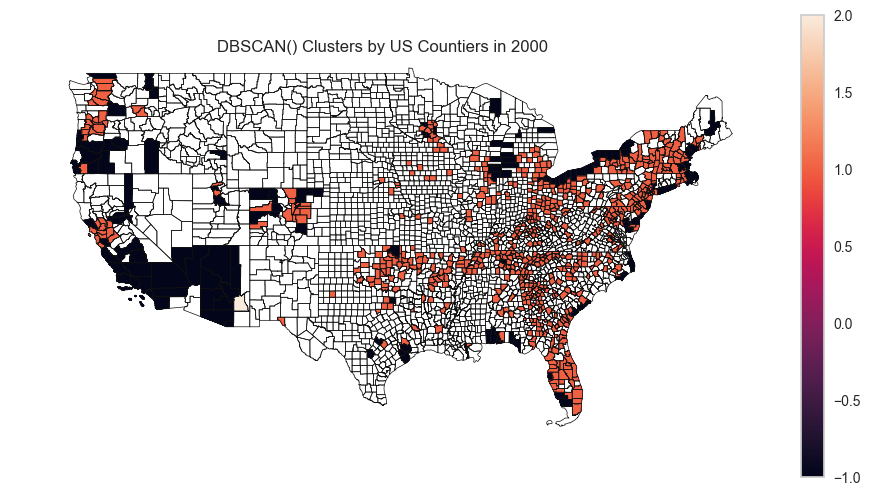

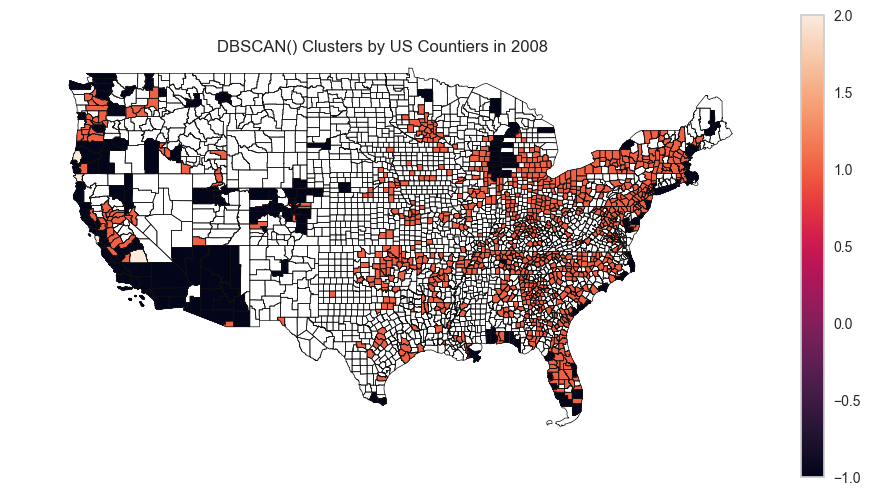

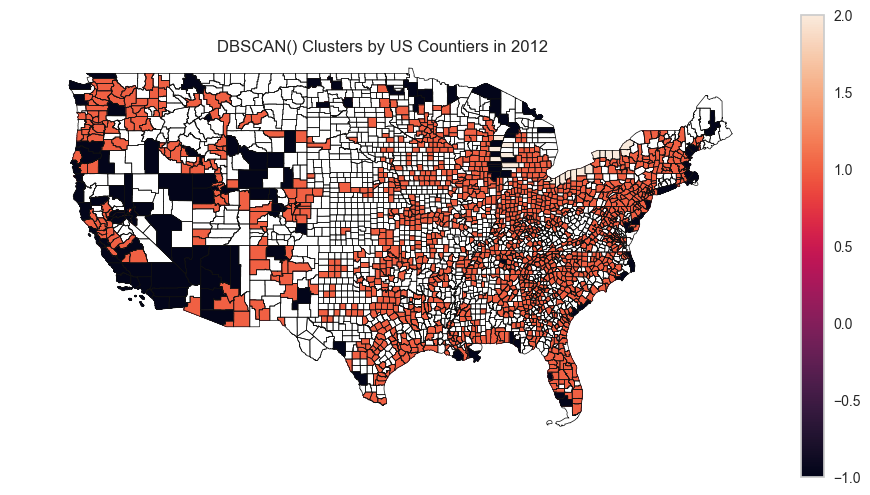

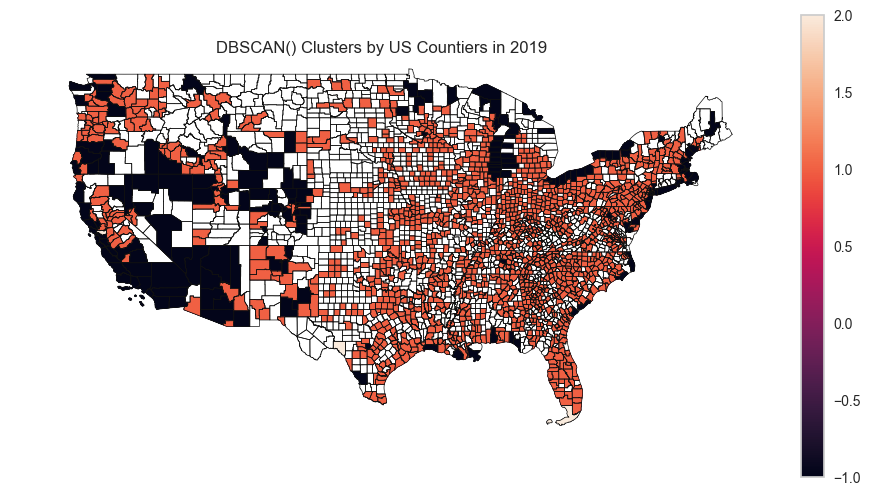

In [48]:
mapping(X_results, 'labels_db', 'DBSCAN()')

> It is more intuitive to interpret DBSCAN() maps because every selected years have all the cluster categories so our legend remains the same. The legends for both KMeans and HC changes (because some years do not have a certain cluster) which could still be informative, but we must be cautious reading the map.

# Conclusion:
Let's revisit our scores for the three models and discuss future steps.

In [52]:
table = pd.DataFrame({
    'Model' : ['KMeans', 'Hierarchical Clustering', 'DBSCAN()'],
    'Dataset': ['All Samples', '10,000 Randomly Selected Samples', 'All Samples'],
    'Tuned Parameters': ['K = 5', 'Ward Linkage', 'min_samples = 20, eps = 0.85'],
    'Scores' : [score_kmeans, hc_score, score_dbs]
})
table

,Model,Dataset,Tuned Parameters,Scores
0,KMeans,All Samples,K = 5,1.685586
1,Hierarchical Clustering,"10,000 Randomly Selected Samples",Ward Linkage,1.690917
2,DBSCAN(),All Samples,"min_samples = 20, eps = 0.85",1.275934


In all, the DBSCAN(min_samples = 20, eps=0.85) gives us the best clusters metric-wise. It also helps when the years 2000, 2008, 2012, and 2019 have the same clusters so we can map them onto the US map and see the counties' association with the clusters change over time.

In terms of further steps, it might be worth looking into the DBSCAN()'s majority clusters: -1, 1, and 0. -1 is technically classified as "noise" which contains a lot of coast cities.

## References:
1. Lab 10 Solutions: https://canvas.cmu.edu/courses/38950/files/11085230?module_item_id=5780126&fd_cookie_set=1
2. https://medium.com/analytics-vidhya/the-ultimate-guide-for-clustering-mixed-data-1eefa0b4743b
3. https://medium.com/@hhuseyincosgun/which-data-scaling-technique-should-i-use-a1615292061e
4. https://stackoverflow.com/questions/993358/creating-a-range-of-dates-in-python
5. https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.date_range.html
6. https://scikit-learn.org/stable/modules/clustering.html#davies-bouldin-index
7. PCA and UL in class exercise solution: https://canvas.cmu.edu/courses/38950/files/11085228?module_item_id=5780124&fd_cookie_set=1
8. Lab 9 Solutions: https://canvas.cmu.edu/courses/38950/files/11085229?module_item_id=5780122&fd_cookie_set=1
9. https://docs.scipy.org/doc/scipy/reference/generated/scipy.cluster.hierarchy.dendrogram.html
10. https://www.displayr.com/what-is-hierarchical-clustering/
11. Hierarchical Clustering In-class Exercise Solutions: https://canvas.cmu.edu/courses/38950/files/11034273?module_item_id=5773724&fd_cookie_set=1
12. https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html
13. https://scikit-learn.org/stable/modules/clustering.html#dbscan
14. https://medium.com/@tarammullin/dbscan-parameter-estimation-ff8330e3a3bd
15. https://stats.stackexchange.com/questions/88872/a-routine-to-choose-eps-and-minpts-for-dbscan
16. https://kneed.readthedocs.io/en/stable/parameters.html
17. https://www.freecodecamp.org/news/sort-dictionary-by-value-in-python/
18. https://scikit-learn.org/stable/auto_examples/cluster/plot_dbscan.html
19. https://www.geeksforgeeks.org/convert-the-column-type-from-string-to-datetime-format-in-pandas-dataframe/
20. https://stackoverflow.com/questions/58476654/how-to-remove-or-hide-x-axis-labels-from-a-plot
21. https://stackoverflow.com/questions/57414771/how-to-plot-only-the-lower-triangle-of-a-seaborn-heatmap